<a href="https://colab.research.google.com/github/Tommy-D0/Happiness-Levels-in-countries/blob/main/Final_Project_Happiness_world.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Final project: Analysis happiness levels in countries

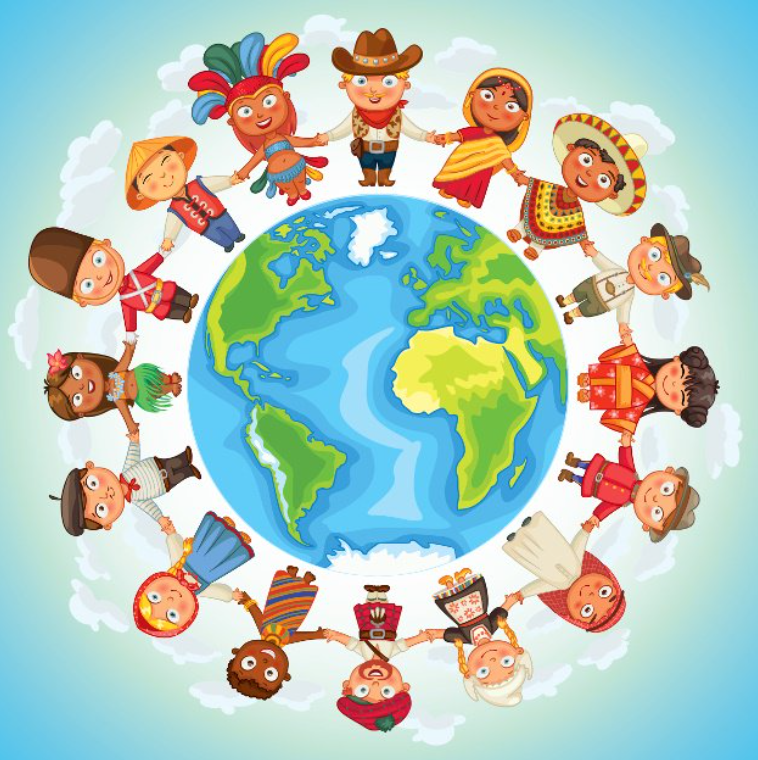

Hello world! Welcome to my chanel, I would like to introduce **Guided Project series** 😀 <br> This project is intended to help you with some ideas on how a data analysis should be, so that you can get over Milestone and Final projects at the fastest time with a "Passed" right after the first round! Now, let's start this journey!

Supposedly, you are a Data Analyst in happiness levels in the world. You have the authority to access to a database consisting of 200 counties, health, GDP, Society, etc. <br> Using this dataset, we will go from the beginning till the end of a data analysis project. <br>

## Overview data sources and variable defination

The survey measure of SWB is from the Jan 20, 2023 release of the Gallup World Poll (GWP) covering years from 2006 to 2022. It is the national average response to the question of life evaluations:
- **Life ladder**: (From 0 to 10) Happiness score or subjective well-being: “with steps numbered from 0 at the bottom to 10 at the top. The top of the ladder represents the best possible life for you and the bottom of the ladder represents the worst possible life for you.
- **GDP**: GDP per capita is calculated by dividing the country's GDP by the country's total population. Another called living standard of a citizen. Countries with a higher GDP per capita tend to be those that are industrial, developed countries.

- **Income**: The statistics of **log GDP per capita** in purchasing power parity [PPP](https://vietnambiz.vn/ngang-gia-suc-mua-purchasing-power-parity-la-gi-han-che-cua-ngang-gia-suc-mua-20190917115904173.htm) at constant 2017 international dollar prices are from World Development Indicators (WDI, version 17, metadata last updated on Jan 22, 2023).

- **Health**: (From 0 to 100) Healthy life expectancies at birth.

- **Society**: (From 0 to 1) The ratio average of social support is that supporting others in life.

- **Freedom**: (From 0 to 1) The ratio average of the freedom to make life choices.

- **Corruption**: (From 0 to 1) Corruption Perception is the national average of the survey responses.

- **Positive**: Positive affect is defined as the average of three positive affect measures in GWP: laugh, enjoyment and doing interesting things.

- **Negative**: (From 0 to 1) Negative affect is defined as the average of three negative affect measures in GWP. They are worry, sadness and anger.

The specific explanation of each column in this dataset is [here](https://docs.google.com/document/d/1I_-ZWAhefMqrEHgAwNCnLbVURfKcuYZOgAy-PiSi5VE/edit)

You can download dataset happiness levels file [here](https://docs.google.com/spreadsheets/d/1R9okNF_5VllFEWFISHyzjMle1ewvnUGC/edit?usp=drive_web&ouid=101472782459831856499&rtpof=true)

You can download dataset mean age file [here](https://ourworldindata.org/grapher/median-age)

**Big question:**
1. What is considered a happy country?
2. What factors play an important role in impacting happiness levels?
3. How much these factors impact on happiness levels of a nation?
4. How to improve happiness levels?

## I. Preparation & Cleaning Data

#### 1/ Import relevant libraries

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from google.colab import files

warnings.filterwarnings("ignore")

# sns.set_style("darkgrid")

In [ ]:
# import dataset

url = 'https://github.com/Tommy-D0/Happiness-Levels-in-countries/raw/main/Dataset_world%20happiness_2022.xls'
df = pd.read_excel(url)
df.head()

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
0,Afghanistan,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686,0.414297,0.258195
1,Afghanistan,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035,0.481421,0.237092
2,Afghanistan,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766,0.516907,0.275324
3,Afghanistan,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109,0.479835,0.267175
4,Afghanistan,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620,0.613513,0.267919


In [ ]:
mean_age = 'https://raw.githubusercontent.com/Tommy-D0/Happiness-Levels-in-countries/main/median-age.csv'
ma = pd.read_csv(mean_age)
ma.head()

,Entity,Code,Year,Median age - Sex: all - Age: all - Variant: estimates,Median age - Sex: all - Age: all - Variant: medium
0,Afghanistan,AFG,1950,18.4,NaN
1,Afghanistan,AFG,1951,18.4,NaN
2,Afghanistan,AFG,1952,18.4,NaN
3,Afghanistan,AFG,1953,18.3,NaN
4,Afghanistan,AFG,1954,18.3,NaN


In [ ]:
link = 'https://raw.githubusercontent.com/Tommy-D0/Happiness-Levels-in-countries/main/Dataset%20GDP%20per%20capita.csv'
ur = pd.read_csv(link)
ur.head()

,Country Name,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Aruba,25832.925560,27665.299480,29011.639060,25740.770230,24452.588740,26043.156330,25611.175770,26514.868980,26940.264110,28419.264530,28449.712950,29329.081750,30918.483580,31902.809820,24008.127820,29127.759380,33300.838820
1,Africa Eastern and Southern,1232.423412,1376.638778,1435.808451,1420.293773,1656.366272,1806.768778,1773.651568,1736.849038,1725.332959,1554.167299,1444.003514,1625.286236,1558.307482,1507.982881,1355.805923,1545.613215,1644.062829
2,Afghanistan,274.015394,376.318296,382.533804,453.387382,562.499219,608.738856,653.417479,638.733185,626.512931,566.881133,523.053012,526.140801,492.090632,497.741429,512.055098,355.777826,NaN
3,Africa Western and Central,1243.173889,1421.272934,1685.556069,1467.615875,1679.887830,1861.381068,1957.917784,2154.150832,2248.316255,1882.264038,1648.762676,1590.277754,1735.374911,1812.446822,1688.075575,1766.943618,1785.312219
4,Angola,2597.963585,3121.348735,4081.717497,3123.698898,3586.663680,4608.155166,5083.826851,5061.349240,5011.984412,3217.339244,1809.709377,2439.374441,2540.508878,2191.347764,1450.905112,1927.474078,3000.444231


#### 2/ Overview of the dataset

We firstly have a look to the overview of dataframe

In [ ]:
df.sample(5)

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
1990,Uganda,2015,4.237687,7.653903,0.746633,56.299999,0.757835,0.131468,0.872740,0.678660,0.352848
2148,Zambia,2015,4.843164,8.121296,0.691483,52.700001,0.758654,-0.039224,0.871020,0.634062,0.381731
409,Colombia,2022,5.891712,9.659548,0.876949,69.525002,0.799184,-0.161807,0.862641,0.761744,0.305504
714,Greece,2009,6.038575,10.482680,0.793318,69.919998,0.443108,-0.296519,0.958768,0.614258,0.253589
117,Azerbaijan,2017,5.152279,9.555448,0.787039,63.349998,0.731030,-0.228387,0.652539,0.511527,0.198319


In [ ]:
ma.sample(5)

,Entity,Code,Year,Median age - Sex: all - Age: all - Variant: estimates,Median age - Sex: all - Age: all - Variant: medium
37246,Vatican,VAT,2050,NaN,47.4
4706,British Virgin Islands,VGB,1975,18.7,NaN
36199,United Kingdom,GBR,2060,NaN,46.5
7339,Cook Islands,COK,2041,NaN,35.3
8718,Denmark,DNK,2061,NaN,44.6


Then, we will find out the data type of each column as well as the overview of null value distribution over columns

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2172 entries, 0 to 2171
Data columns (total 11 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Country name                      2172 non-null   object 
 1   year                              2172 non-null   int64  
 2   Life Ladder                       2172 non-null   float64
 3   Log GDP per capita                2152 non-null   float64
 4   Social support                    2159 non-null   float64
 5   Healthy life expectancy at birth  2118 non-null   float64
 6   Freedom to make life choices      2141 non-null   float64
 7   Generosity                        2125 non-null   float64
 8   Perceptions of corruption         2058 non-null   float64
 9   Positive affect                   2149 non-null   float64
 10  Negative affect                   2157 non-null   float64
dtypes: float64(9), int64(1), object(1)
memory usage: 186.8+ KB


In [ ]:
# Having 165 countries involved survey
df["Country name"].nunique()

165

In [ ]:
ma.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38505 entries, 0 to 38504
Data columns (total 5 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   Entity                                                 38505 non-null  object 
 1   Code                                                   35938 non-null  object 
 2   Year                                                   38505 non-null  int64  
 3   Median age - Sex: all - Age: all - Variant: estimates  18360 non-null  float64
 4   Median age - Sex: all - Age: all - Variant: medium     20145 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 1.5+ MB


#### 3/ Remove unwanted data

🧠 **Dataset Mean Age** (ma)

In [ ]:
ma.head()

,Entity,Code,Year,Median age - Sex: all - Age: all - Variant: estimates,Median age - Sex: all - Age: all - Variant: medium
0,Afghanistan,AFG,1950,18.4,NaN
1,Afghanistan,AFG,1951,18.4,NaN
2,Afghanistan,AFG,1952,18.4,NaN
3,Afghanistan,AFG,1953,18.3,NaN
4,Afghanistan,AFG,1954,18.3,NaN


In [ ]:
ma.drop("Code", inplace = True, axis=1)
ma.head()

,Entity,Year,Median age - Sex: all - Age: all - Variant: estimates,Median age - Sex: all - Age: all - Variant: medium
0,Afghanistan,1950,18.4,NaN
1,Afghanistan,1951,18.4,NaN
2,Afghanistan,1952,18.4,NaN
3,Afghanistan,1953,18.3,NaN
4,Afghanistan,1954,18.3,NaN


In [ ]:
ma.columns = ["Country", "Year", "Mean Age", "Mean Age Prediction"]
ma.head()

,Country,Year,Mean Age,Mean Age Prediction
0,Afghanistan,1950,18.4,NaN
1,Afghanistan,1951,18.4,NaN
2,Afghanistan,1952,18.4,NaN
3,Afghanistan,1953,18.3,NaN
4,Afghanistan,1954,18.3,NaN


In [ ]:
ma.fillna(value = 0, inplace = True)
ma.isna().sum()

Country                0
Year                   0
Mean Age               0
Mean Age Prediction    0
dtype: int64

In [ ]:
# root data
df["year"].value_counts()

year
2017    147
2011    146
2014    144
2019    143
2015    142
2016    141
2012    141
2018    141
2013    136
2010    124
2021    122
2020    116
2009    114
2022    114
2008    110
2007    102
2006     89
Name: count, dtype: int64

In [ ]:
# combine mean age
ma["Mean Age"] = ma["Mean Age"] + ma["Mean Age Prediction"]

In [ ]:
ma = ma[(ma["Year"] > 2005) & (ma["Year"] < 2023)]
ma.head()

,Country,Year,Mean Age,Mean Age Prediction
56,Afghanistan,2006,14.3,0.0
57,Afghanistan,2007,14.1,0.0
58,Afghanistan,2008,14.0,0.0
59,Afghanistan,2009,14.3,0.0
60,Afghanistan,2010,14.4,0.0


⏰ **Dataset Happiness levels** (df)

In [ ]:
# In order to get the name of all columns
df.columns

Index(['Country name', 'year', 'Life Ladder', 'Log GDP per capita',
       'Social support', 'Healthy life expectancy at birth',
       'Freedom to make life choices', 'Generosity',
       'Perceptions of corruption', 'Positive affect', 'Negative affect'],
      dtype='object')

In [ ]:
df[df["Country name"].str.contains("Kore")]

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
1753,South Korea,2006,5.332178,10.308637,0.775499,70.019997,0.715242,-0.055842,0.798615,0.545332,0.338152
1754,South Korea,2007,5.767276,10.359961,0.826712,70.239998,0.655828,-0.063150,0.802753,0.611897,0.226402
1755,South Korea,2008,5.389625,10.382052,0.753610,70.459999,0.523679,-0.106095,0.770960,0.553983,0.239057
1756,South Korea,2009,5.647690,10.384801,0.810903,70.680000,0.600166,-0.099825,0.787497,0.595679,0.208521
1757,South Korea,2010,6.116024,10.445652,0.815517,70.900002,0.676653,-0.037169,0.751621,0.626363,0.130337
1758,South Korea,2011,6.946599,10.474155,0.809104,71.120003,0.682356,-0.052450,0.827301,0.587294,0.167833
1759,South Korea,2012,6.003287,10.492640,0.775397,71.339996,0.618398,NaN,0.843719,0.610192,0.206365
1760,South Korea,2013,5.958810,10.519244,0.796694,71.559998,0.641884,-0.053803,0.831863,0.588525,0.188766
1761,South Korea,2014,5.801325,10.544485,0.737754,71.779999,0.623194,-0.046935,0.834068,0.575069,0.282808
1762,South Korea,2015,5.780211,10.566916,0.768351,72.000000,0.615849,-0.039612,0.840722,0.560942,0.244324


In [ ]:
df.drop(["Log GDP per capita", "Generosity"], inplace = True, axis=1)

In [ ]:
# Rename columns
df.columns = ["Country", "Year", "Life Ladder", "Society", "Health",
               "Freedom", "Corruption", "Possitive", "Negative"]
df.head()

,Country,Year,Life Ladder,Society,Health,Freedom,Corruption,Possitive,Negative
0,Afghanistan,2008,3.723590,0.450662,50.500000,0.718114,0.881686,0.414297,0.258195
1,Afghanistan,2009,4.401778,0.552308,50.799999,0.678896,0.850035,0.481421,0.237092
2,Afghanistan,2010,4.758381,0.539075,51.099998,0.600127,0.706766,0.516907,0.275324
3,Afghanistan,2011,3.831719,0.521104,51.400002,0.495901,0.731109,0.479835,0.267175
4,Afghanistan,2012,3.782938,0.520637,51.700001,0.530935,0.775620,0.613513,0.267919


⚾ **Dataset GDP per capita** (ur)

In [ ]:
ur.rename(columns={"Country Name":"Country"}, inplace = True)

In [ ]:
# transform unemployment_ratio into wide table
ur = ur.melt(id_vars="Country", var_name="Year", value_name="GDP")

In [ ]:
ur.head()

,Country,Year,GDP
0,Aruba,2006,25832.925560
1,Africa Eastern and Southern,2006,1232.423412
2,Afghanistan,2006,274.015394
3,Africa Western and Central,2006,1243.173889
4,Angola,2006,2597.963585


#### 4/ Deal with duplication

In [ ]:
# Check whether there is any duplicated values
df.duplicated().sum()

0

In [ ]:
ma.duplicated().sum()

0

#### 5/ Deal with missing values

Despite of the fact that we tend to use drop function when dealing with missing data, that should not be the first thing you come up with. Understanding your data is the most important thing you should be familiar before making any further steps. <br>
Let's see which columns contain missing values:

In [ ]:
# Total null values
df.isna().sum()

Country          0
Year             0
Life Ladder      0
Society         13
Health          54
Freedom         31
Corruption     114
Possitive       23
Negative        15
dtype: int64

In [ ]:
# The percentage of null values in each column

df.isna().sum() / df.shape[0] * 100

Country        0.000000
Year           0.000000
Life Ladder    0.000000
Society        0.598527
Health         2.486188
Freedom        1.427256
Corruption     5.248619
Possitive      1.058932
Negative       0.690608
dtype: float64

#####🧠 Datasets Mean Age (ma)

* As we have learned, it is a normal thing that your dataset contains mislabeled and corrupted data.

* Besides, there are cases the labels of data do not fit your intend on the further analysis. We need to change it to a suitable way for easy working out.

In [ ]:
ma[ma["Country"].str.contains('Turk')].head() # The wrong country name

,Country,Year,Mean Age,Mean Age Prediction
35088,Turkey,2006,25.7,0.0
35089,Turkey,2007,26.1,0.0
35090,Turkey,2008,26.4,0.0
35091,Turkey,2009,26.8,0.0
35092,Turkey,2010,27.1,0.0


In [ ]:
df[df["Country"] == "Turkiye"].head()

,Country,Year,Life Ladder,Society,Health,Freedom,Corruption,Possitive,Negative
1956,Turkiye,2007,5.623472,0.792273,66.419998,0.459312,0.799733,0.592484,0.395127
1957,Turkiye,2008,5.118232,0.644874,66.580002,0.415498,0.785391,0.510494,0.345338
1958,Turkiye,2009,5.212842,0.754646,66.739998,0.455817,0.852887,0.454365,0.316302
1959,Turkiye,2010,5.490347,0.794905,66.900002,0.514920,0.810896,0.532230,0.327066
1960,Turkiye,2011,5.271944,0.691902,67.059998,0.445607,0.648596,0.512298,0.379784


In [ ]:
# Keep seeking the mislabeled country name

ma[ma["Country"].str.contains('Palestine')].head()

,Country,Year,Mean Age,Mean Age Prediction
26783,Palestine,2006,16.1,0.0
26784,Palestine,2007,16.3,0.0
26785,Palestine,2008,16.6,0.0
26786,Palestine,2009,16.8,0.0
26787,Palestine,2010,17.1,0.0


In [ ]:
# Rename labels values "Country"
a = {"Turkey":"Turkiye", "Palestine":"State of Palestine", "Taiwan":"Taiwan Province of China",
     "Hong Kong":"Hong Kong S.A.R. of China", "Cote d'Ivoire":"Ivory Coast", "Congo":"Congo (Brazzaville)"}

def rename_country(x):
  for i in a.keys():
    if i in x:
      return a[i]
  return x

ma["Country"] = ma["Country"].apply(rename_country)

##### ⏰ Dataset Happiness levels `(df)`

* merge datasets between `(ma)` and `(df)`

In [ ]:
df = pd.merge(df, ma.loc[:,"Country":"Mean Age"], on=["Country", "Year"], how= "left")
df.head()

,Country,Year,Life Ladder,Society,Health,Freedom,Corruption,Possitive,Negative,Mean Age
0,Afghanistan,2008,3.723590,0.450662,50.500000,0.718114,0.881686,0.414297,0.258195,14.0
1,Afghanistan,2009,4.401778,0.552308,50.799999,0.678896,0.850035,0.481421,0.237092,14.3
2,Afghanistan,2010,4.758381,0.539075,51.099998,0.600127,0.706766,0.516907,0.275324,14.4
3,Afghanistan,2011,3.831719,0.521104,51.400002,0.495901,0.731109,0.479835,0.267175,14.7
4,Afghanistan,2012,3.782938,0.520637,51.700001,0.530935,0.775620,0.613513,0.267919,15.0


In [ ]:
df.isna().sum()

Country          0
Year             0
Life Ladder      0
Society         13
Health          54
Freedom         31
Corruption     115
Possitive       23
Negative        15
Mean Age        13
dtype: int64

In [ ]:
df.isna().sum()

Country          0
Year             0
Life Ladder      0
Society         13
Health          54
Freedom         31
Corruption     115
Possitive       23
Negative        15
Mean Age        13
dtype: int64

In [ ]:
# Check null values of Corruption columns

df[df["Corruption"].isna()]["Country"].value_counts()

Country
China                   16
Saudi Arabia            14
United Arab Emirates    12
Jordan                  11
Turkmenistan            10
Kuwait                   7
Egypt                    6
Bahrain                  6
Malta                    5
Vietnam                  4
Qatar                    4
Yemen                    3
Uzbekistan               2
Algeria                  2
Libya                    2
Congo (Brazzaville)      2
Maldives                 1
Oman                     1
Laos                     1
Singapore                1
South Africa             1
Ethiopia                 1
Cuba                     1
Cambodia                 1
Madagascar               1
Name: count, dtype: int64

The top 3 countries have not mentioned the corruption rate, so we assign "Unknown". However, the remaining countries have mentioned previous years, so we gonna fill values before.

In [ ]:
a = ["China", "Saudi Arabia", "United Arab Emirates"]

for i in a:
  df.loc[df['Country'] == i, 'Corruption'] = df["Corruption"].mean()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2185 entries, 0 to 2184
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Country      2185 non-null   object 
 1   Year         2185 non-null   int64  
 2   Life Ladder  2185 non-null   float64
 3   Society      2172 non-null   float64
 4   Health       2131 non-null   float64
 5   Freedom      2154 non-null   float64
 6   Corruption   2112 non-null   float64
 7   Possitive    2162 non-null   float64
 8   Negative     2170 non-null   float64
 9   Mean Age     2172 non-null   float64
dtypes: float64(8), int64(1), object(1)
memory usage: 170.8+ KB


In [ ]:
df = df[df["Corruption"] != "Unknown"]

In [ ]:
df["Corruption"].astype("float64")

0       0.881686
1       0.850035
2       0.706766
3       0.731109
4       0.775620
          ...   
2180    0.844209
2181    0.830652
2182    0.788523
2183    0.756945
2184    0.752632
Name: Corruption, Length: 2185, dtype: float64

In [ ]:
df[df["Corruption"].isna()]["Country"].value_counts()

Country
Jordan                 11
Turkmenistan           10
Kuwait                  7
Bahrain                 6
Egypt                   6
Malta                   5
Vietnam                 4
Qatar                   4
Yemen                   3
Uzbekistan              2
Algeria                 2
Libya                   2
Congo (Brazzaville)     2
Maldives                1
Laos                    1
Oman                    1
Ethiopia                1
Singapore               1
South Africa            1
Cuba                    1
Cambodia                1
Madagascar              1
Name: count, dtype: int64

##### ⚾ Datasets GDP per capita (ur)

In [ ]:
ur[ur["Country"].str.contains('Vene')].values[0]

array(['Venezuela, RB', '2006', 6769.868414], dtype=object)

In [ ]:
df[df["Country"].str.contains('Gambi')].values[0]

array(['Gambia', 2017, 4.117938995361328, 0.6970015168190002,
       56.400001525878906, 0.8123258352279663, 0.5716155767440796,
       0.7702941298484802, 0.27724719047546387, 16.3], dtype=object)

In [ ]:
ur["Year"] = ur["Year"].astype("int64")
# df["Year"] = df["Year"].astype("str")

In [ ]:
df.head()

,Country,Year,Life Ladder,Society,Health,Freedom,Corruption,Possitive,Negative,Mean Age
0,Afghanistan,2008,3.723590,0.450662,50.500000,0.718114,0.881686,0.414297,0.258195,14.0
1,Afghanistan,2009,4.401778,0.552308,50.799999,0.678896,0.850035,0.481421,0.237092,14.3
2,Afghanistan,2010,4.758381,0.539075,51.099998,0.600127,0.706766,0.516907,0.275324,14.4
3,Afghanistan,2011,3.831719,0.521104,51.400002,0.495901,0.731109,0.479835,0.267175,14.7
4,Afghanistan,2012,3.782938,0.520637,51.700001,0.530935,0.775620,0.613513,0.267919,15.0


In [ ]:
df[df["Country"].str.contains('Gambia')].head()

,Country,Year,Life Ladder,Society,Health,Freedom,Corruption,Possitive,Negative,Mean Age
672,Gambia,2017,4.117939,0.697002,56.400002,0.812326,0.571616,0.770294,0.277247,16.3
673,Gambia,2018,4.922099,0.684800,56.700001,0.718729,0.691070,0.758668,0.379208,16.4
674,Gambia,2019,5.163627,0.693870,57.000000,0.676595,0.798108,0.717893,0.400723,16.5
675,Gambia,2022,4.279441,0.587696,57.900002,0.599087,0.883752,0.722409,0.437860,17.0


In [ ]:
# Rename label values of "Country"

a = {"Egypt":"Egypt", "Korea, Rep.":"South Korea", "Kyrgy":"Kyrgyzstan", "Ivoi":"Ivory Coast",
     "Russia":"Russia", "Viet":"Vietnam", 'Venezuela, RB':"Venezuela",
     "Iran":"Iran", "Congo, Rep.":"Congo (Brazzaville)", "Slovak":"Slovakia",
     "Yemen":"Yemen", "Hong Kong":"Hong Kong S.A.R. of China", "Lao":"Laos",
     "Syria":"Syria","Congo, Dem. Rep.":"Congo (Kinshasa)",'Gambia, The': "Gambia"}

ur["Country"] = ur["Country"].apply(rename_country)

In [ ]:
ur[ur["Country"].str.contains("Viet")]["Country"].values[1]

'Vietnam'

In [ ]:
# Merge datasets
df = pd.merge(df, ur, on= ["Country", "Year"], how="left")

In [ ]:
df[df["GDP"].isna()]["Country"].value_counts()

Country
State of Palestine          15
Taiwan Province of China    15
Venezuela                    8
Somaliland region            4
South Sudan                  2
Afghanistan                  1
Kosovo                       1
Lebanon                      1
Name: count, dtype: int64

In [ ]:
# Assign null values into "Uknown"
a = ["State of Palestine", "Taiwan Province of China"]

for i in a:
  df.loc[df['Country'] == i, 'GDP'] = "Unknown"

In [ ]:
df[df["GDP"].isna()]["Country"].value_counts()

Country
Venezuela            8
Somaliland region    4
South Sudan          2
Afghanistan          1
Kosovo               1
Lebanon              1
Name: count, dtype: int64

In [ ]:
df = df[df["GDP"] !="Unknown"]

In [ ]:
df["GDP"].astype("float64")

0        382.533804
1        453.387382
2        562.499219
3        608.738856
4        653.417479
           ...     
2180    2269.177012
2181    1421.868596
2182    1372.696674
2183    1773.920411
2184    1676.821489
Name: GDP, Length: 2155, dtype: float64

Comment:
Total missing values account for less than 2% of total values.Therefore, missing values do not affect to the analysis of these variables. We can use function `fill forward` to fill these missing value rows

In [ ]:
# fill null values by forward fill function
df.ffill(inplace = True)

In [ ]:
# Create a new columns log(GDP per capita) = "income"

import math
df["Income"] = [math.log(i, 3.26) for i in df["GDP"]]
df.drop("GDP", inplace = True, axis= 1) # drop GDP

In [ ]:
df.head()

,Country,Year,Life Ladder,Society,Health,Freedom,Corruption,Possitive,Negative,Mean Age,Income
0,Afghanistan,2008,3.723590,0.450662,50.500000,0.718114,0.881686,0.414297,0.258195,14.0,5.032310
1,Afghanistan,2009,4.401778,0.552308,50.799999,0.678896,0.850035,0.481421,0.237092,14.3,5.176107
2,Afghanistan,2010,4.758381,0.539075,51.099998,0.600127,0.706766,0.516907,0.275324,14.4,5.358588
3,Afghanistan,2011,3.831719,0.521104,51.400002,0.495901,0.731109,0.479835,0.267175,14.7,5.425439
4,Afghanistan,2012,3.782938,0.520637,51.700001,0.530935,0.775620,0.613513,0.267919,15.0,5.485375


In [ ]:
# Recheck whether there is any null values still
df.isna().sum()

Country        0
Year           0
Life Ladder    0
Society        0
Health         0
Freedom        0
Corruption     0
Possitive      0
Negative       0
Mean Age       0
Income         0
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2155 entries, 0 to 2184
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Country      2155 non-null   object 
 1   Year         2155 non-null   int64  
 2   Life Ladder  2155 non-null   float64
 3   Society      2155 non-null   float64
 4   Health       2155 non-null   float64
 5   Freedom      2155 non-null   float64
 6   Corruption   2155 non-null   float64
 7   Possitive    2155 non-null   float64
 8   Negative     2155 non-null   float64
 9   Mean Age     2155 non-null   float64
 10  Income       2155 non-null   float64
dtypes: float64(9), int64(1), object(1)
memory usage: 202.0+ KB


As there are no duplicated and missing values existed, we are all good to go !!!

In [ ]:
# from google.colab import files
# files.download("Database.csv")

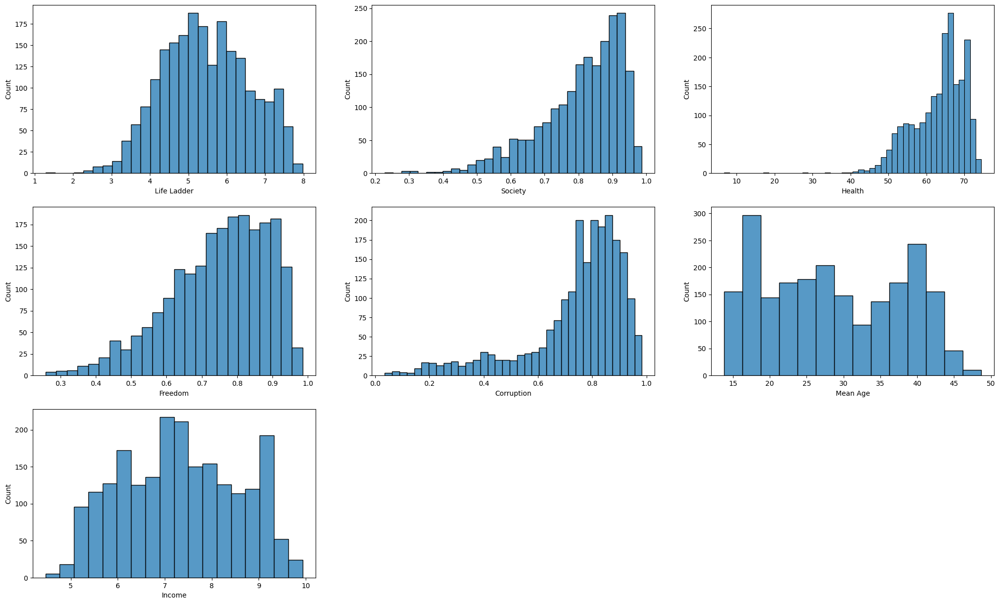

In [ ]:
# Histogram can be a good chart to support the above explanation on Box plot
k = ['Life Ladder', 'Society', 'Health', 'Freedom', 'Corruption','Mean Age',
     'Income']

plt.figure(figsize= (25,15))
for i in k:
  plt.subplot(331+ k.index(i))
  sns.histplot(df, x= i)

plt.show()

## II. Exploratory Data Analysis (EDA)

### 1/ Overview Data

Using `df.describe()` will give you the statistical information of all continuous variables in the dataset

In [ ]:
# Continuous columns
df.describe()

,Year,Life Ladder,Society,Health,Freedom,Corruption,Possitive,Negative,Mean Age,Income
count,2155.000000,2155.000000,2155.000000,2155.000000,2155.000000,2155.000000,2155.000000,2155.000000,2155.000000,2155.000000
mean,2014.289095,5.462011,0.808565,63.141125,0.748381,0.743558,0.651497,0.272697,28.726821,7.329294
std,4.632697,1.125236,0.121960,6.923798,0.140041,0.183663,0.105877,0.086182,9.196902,1.237285
min,2006.000000,1.281271,0.228217,6.720000,0.257534,0.035198,0.178886,0.083426,13.800000,4.460856
25%,2011.000000,4.635537,0.741258,58.750000,0.657982,0.691094,0.571407,0.208559,20.500000,6.301367
50%,2014.000000,5.404593,0.834077,64.879997,0.770417,0.794450,0.661971,0.261661,28.000000,7.307257
75%,2018.000000,6.277411,0.904432,68.300003,0.859374,0.866092,0.736442,0.322944,37.700000,8.317871
max,2022.000000,7.970892,0.987343,74.474998,0.985178,0.983276,0.883586,0.704590,48.700000,9.931325


Histogram can be a good chart to support the above explanation on Box plot

(1.0, 10.0)

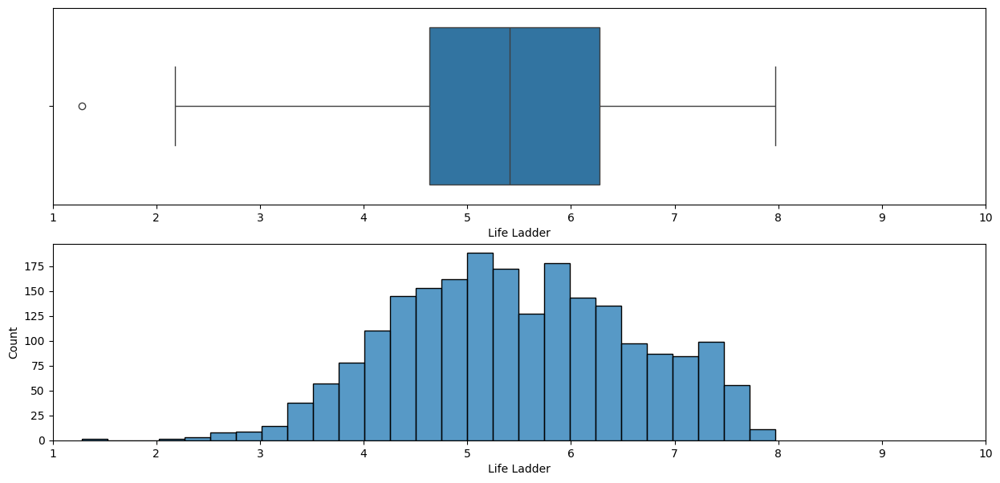

In [ ]:
plt.figure(figsize=(15,7))

plt.subplot(211)
sns.boxplot(data=df, x='Life Ladder')
plt.xlim(1,10)

plt.subplot(212)
sns.histplot(data=df, x='Life Ladder')
plt.xlim(1,10)

# plt.savefig("images.png")
# files.download("images.png")

What we can get from above Box plot of `Life Ladder`:
- Mininum: the worst lives of the life ladder under 2
- Lower Quartile (25%): 25% of countries less happy and evaluated a life ladder from 1.28 to 4.64.
- Median (25-75%): half of nations are medium happiness from 4.64 to 6.30
- Upper Quartile (75%): 25% of nations in the world have a high happiness level fluctuate between 6.28 and 7.97
- Maximum: the happiest countries have the life ladder about 8 scores

### 2/ Classification

*  Apply K-Means on `Life Ladder` to cluster happy countries.
* Using Elbow method to approximate the number of clusters.

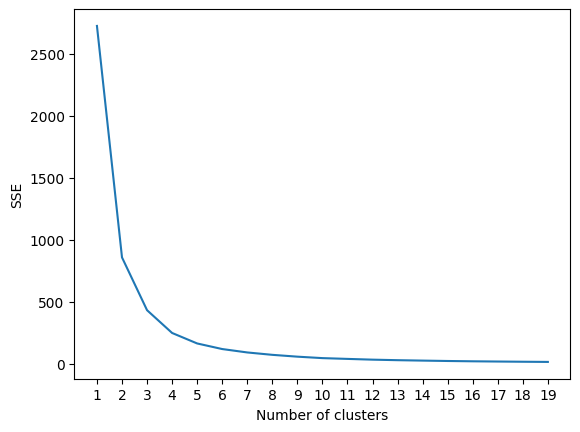

In [ ]:
from sklearn.cluster import KMeans

X = df[["Life Ladder"]].values

# Số sse (sum of squared errors) càng nhỏ --> Các data ở rất gần centroid mà nó thuộc về

sse = []
k_values = range(1, 20)

for i in k_values:
    kmeans = KMeans(n_clusters=i, random_state=7)
    kmeans.fit(X)
    sse.append(kmeans.inertia_)

# Plot
plt.plot(k_values, sse)
plt.xlabel("Number of clusters")
plt.xticks(k_values)
plt.ylabel("SSE")
plt.show()

# plt.savefig("K_cluster.png")
# files.download("K_cluster.png")

 The graph illustrate correlation between number of clusters and SSE. From this graph, we can see k-means = 3, showing elbow method clearly, so I choose **k-means = 3**

In [ ]:
# Call, fit the KMean model, and run prediction to find the cluster of each customer.
# Choose n_cluster = 3

kmeans = KMeans(n_clusters = 3, random_state = 7)
clusters = kmeans.fit_predict(X)
clusters

array([2, 2, 2, ..., 2, 2, 2], dtype=int32)

In [ ]:
# Create a new column called "Rank" to save the cluster information

df["Rank"] = clusters
df.head()

,Country,Year,Life Ladder,Society,Health,Freedom,Corruption,Possitive,Negative,Mean Age,Income,Rank
0,Afghanistan,2008,3.723590,0.450662,50.500000,0.718114,0.881686,0.414297,0.258195,14.0,5.032310,2
1,Afghanistan,2009,4.401778,0.552308,50.799999,0.678896,0.850035,0.481421,0.237092,14.3,5.176107,2
2,Afghanistan,2010,4.758381,0.539075,51.099998,0.600127,0.706766,0.516907,0.275324,14.4,5.358588,2
3,Afghanistan,2011,3.831719,0.521104,51.400002,0.495901,0.731109,0.479835,0.267175,14.7,5.425439,2
4,Afghanistan,2012,3.782938,0.520637,51.700001,0.530935,0.775620,0.613513,0.267919,15.0,5.485375,2


In [ ]:
# Check order by rank of clusters

df.groupby("Rank")["Life Ladder"].describe()

,count,mean,std,min,25%,50%,75%,max
Rank,,,,,,,,
0,916.0,5.471384,0.398603,4.809259,5.120756,5.448493,5.836125,6.171485
1,594.0,6.873453,0.450605,6.173176,6.462233,6.853248,7.257296,7.970892
2,645.0,4.148860,0.507504,1.281271,3.838486,4.260491,4.550648,4.808083


We need to rearrange order of cluster. Separate datasets into 3 main categories of happiness levels: low, mid, and high

*   Rank 0 => 1 (High happiness)
*   Rank 2 => 2 (Median happiness)
*   Rank 1 => 3 (Low happiness)



In [ ]:
# reassign label for "Rank"

def order_rank(x):
  if x == 0:
    return "Mid"
  elif x == 1:
    return "High"
  else:
    return "Low"

df["Rank"] = df["Rank"].apply(order_rank)

In [ ]:
# Recheck
df.groupby("Rank")["Life Ladder"].describe()

,count,mean,std,min,25%,50%,75%,max
Rank,,,,,,,,
High,594.0,6.873453,0.450605,6.173176,6.462233,6.853248,7.257296,7.970892
Low,645.0,4.148860,0.507504,1.281271,3.838486,4.260491,4.550648,4.808083
Mid,916.0,5.471384,0.398603,4.809259,5.120756,5.448493,5.836125,6.171485


In [ ]:
df.head()

,Country,Year,Life Ladder,Society,Health,Freedom,Corruption,Possitive,Negative,Mean Age,Income,Rank
0,Afghanistan,2008,3.723590,0.450662,50.500000,0.718114,0.881686,0.414297,0.258195,14.0,5.032310,Low
1,Afghanistan,2009,4.401778,0.552308,50.799999,0.678896,0.850035,0.481421,0.237092,14.3,5.176107,Low
2,Afghanistan,2010,4.758381,0.539075,51.099998,0.600127,0.706766,0.516907,0.275324,14.4,5.358588,Low
3,Afghanistan,2011,3.831719,0.521104,51.400002,0.495901,0.731109,0.479835,0.267175,14.7,5.425439,Low
4,Afghanistan,2012,3.782938,0.520637,51.700001,0.530935,0.775620,0.613513,0.267919,15.0,5.485375,Low


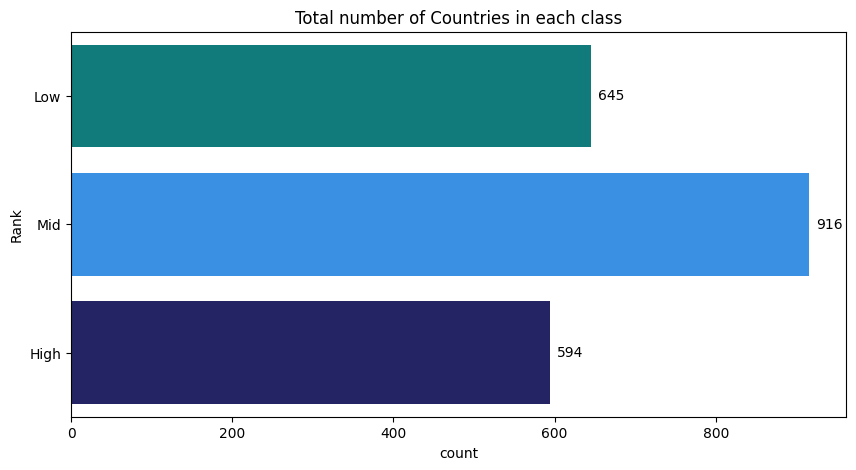

In [ ]:
color_b = ["darkcyan", "dodgerblue","midnightblue"]

plt.figure(figsize=(10, 5))
ax = sns.countplot(data = df, y="Rank", palette= color_b, hue_order=["High", "Mid", "Low"])
plt.title('Total number of Countries in each class')
for i in range(df["Rank"].nunique()):
  ax.bar_label(ax.containers[i], padding= 5)
# plt.show()

# plt.savefig("Total_class.png")
# files.download("Total_class.png")

In [ ]:
sns.color_palette(color_b)

[(0.0, 0.5450980392156862, 0.5450980392156862),
 (0.11764705882352941, 0.5647058823529412, 1.0),
 (0.09803921568627451, 0.09803921568627451, 0.4392156862745098)]

In [ ]:
df1 = df["Rank"].value_counts().reset_index()
df1.head()

,Rank,count
0,Mid,916
1,Low,645
2,High,594


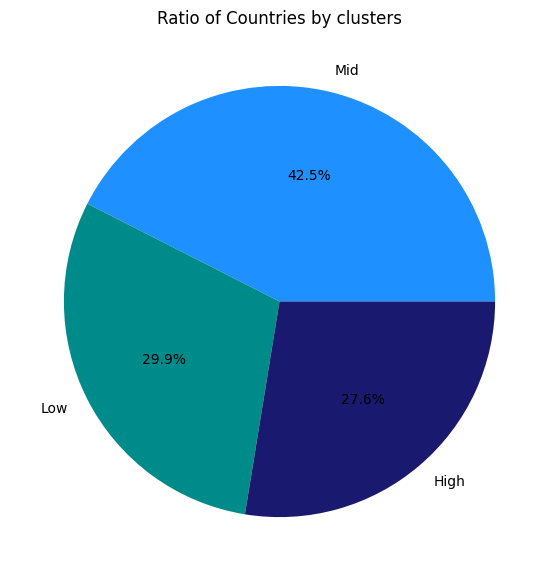

In [ ]:
# Ratio between clusters ["High", "Mid", "Low"]
df1 = df["Rank"].value_counts().reset_index()
color_b = ["dodgerblue", "darkcyan","midnightblue"]

plt.figure(figsize=(7, 7))
plt.pie(data = df1, x="count", labels= "Rank", autopct='%.1f%%', colors = color_b)
plt.title('Ratio of Countries by clusters')
plt.show()

# plt.savefig("pie_rank.png")
# files.download("pie_rank.png")

### 3/ Exploratory

In [ ]:
# df.to_csv("Dataset.csv")
# files.download("Dataset.csv")

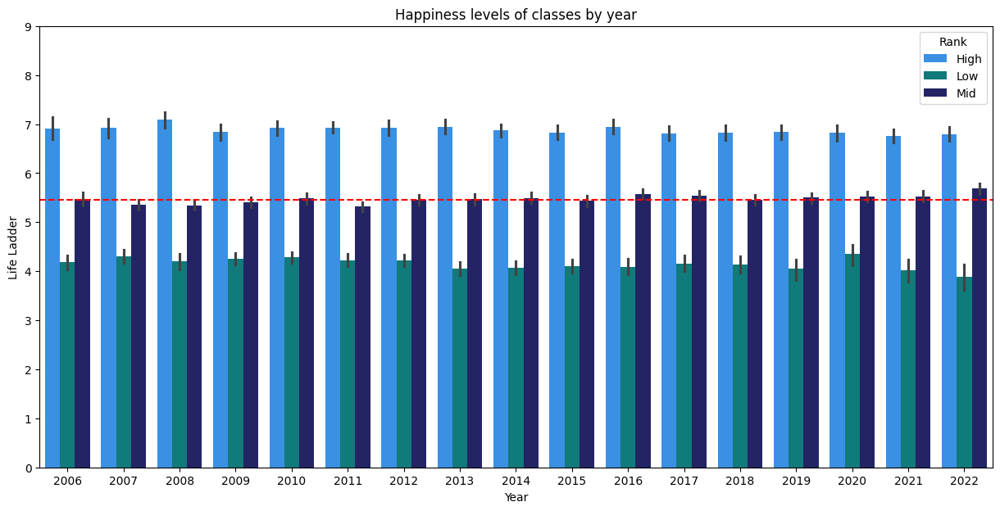

In [ ]:
color_b = ["dodgerblue", "darkcyan","midnightblue"]

plt.figure(figsize =(15,7))

plt.title("Happiness levels of classes by year")
sns.barplot(data= df, x= "Year", y="Life Ladder", hue="Rank", palette= color_b)
plt.ylim(0,9)

plt.axhline(y= df["Life Ladder"].mean(), color='r', linestyle="--")
# plt.text(x= 2021,y=df["Income"].mean()+ 0.5, s=f'Average{df["Income"].mean()}')

plt.show()

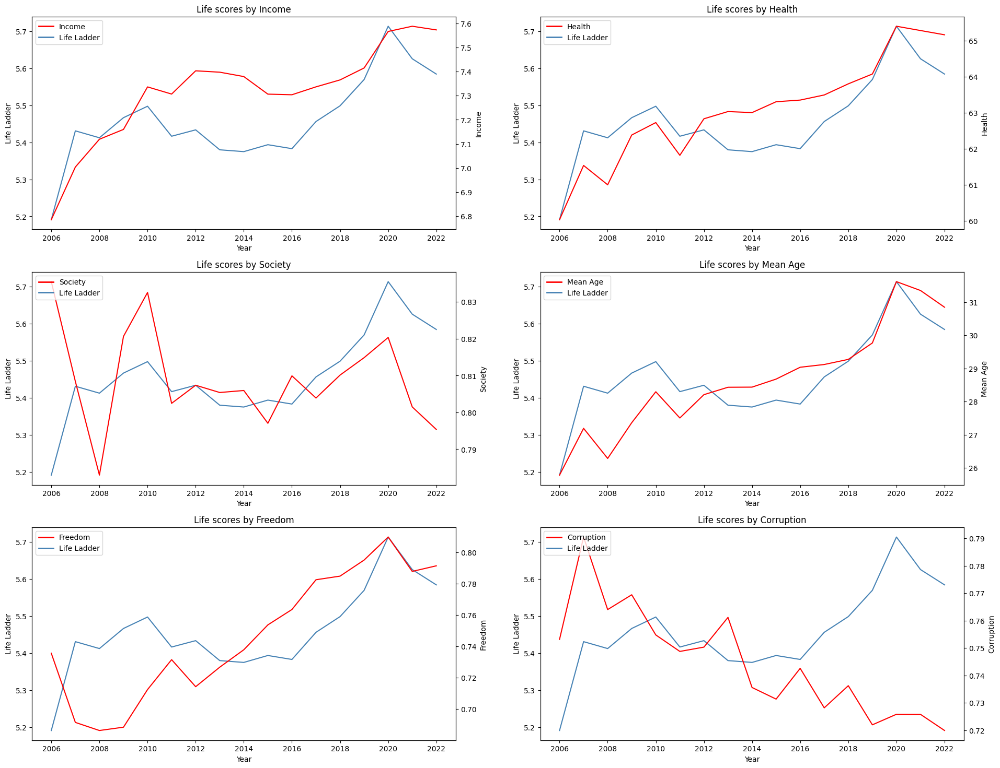

In [ ]:
factors = {"Income":1, "Health":2, "Society":3, "Mean Age":4, "Freedom":5, "Corruption":6}
df2 = df.groupby("Year").mean(numeric_only=True).reset_index()

plt.figure(figsize =(23,18))

for i in factors:
  plt.subplot(320+ factors[i])
  plt.title(f"Life scores by {i}")
  sns.lineplot(data= df2, x= "Year", y="Life Ladder", color="steelblue")
  plt.twinx()
  sns.lineplot(data= df2, x= "Year", y= i, color="r")
  legend_elements = [
      plt.Line2D([0], [0], color='r', lw=2, label= i),
      plt.Line2D([0], [0], color='steelblue', lw=2, label='Life Ladder')]
  plt.legend(handles=legend_elements, loc='upper left')

# plt.savefig("overview_factors.png")
# files.download("overview_factors.png")

In [ ]:
df1 = df.groupby("Year").mean(numeric_only=True).reset_index()
df1.head()

,Year,Life Ladder,Society,Health,Freedom,Corruption,Possitive,Negative,Mean Age,Income
0,2006,5.191055,0.835525,60.027299,0.735659,0.753158,0.662177,0.255850,25.783908,6.785608
1,2007,5.430838,0.808428,61.533070,0.691568,0.790487,0.653704,0.248617,27.194059,7.004026
2,2008,5.412178,0.782963,60.996468,0.686402,0.764035,0.652062,0.243245,26.287156,7.119279
3,2009,5.466379,0.820651,62.377478,0.688520,0.769434,0.646008,0.245057,27.364602,7.160021
4,2010,5.497294,0.832582,62.722746,0.712503,0.754787,0.645317,0.241987,28.297541,7.336326


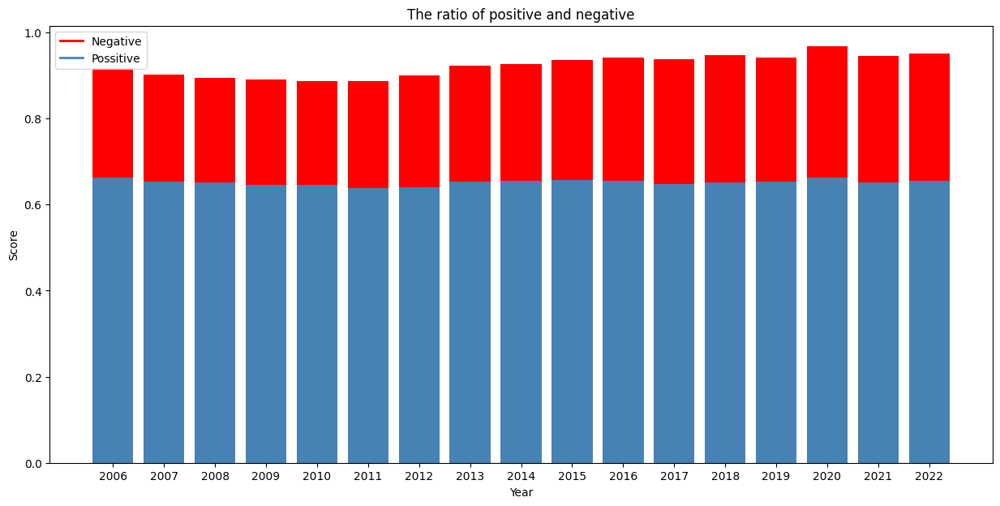

In [ ]:
# create data
plt.figure(figsize=(15,7))

x = df1["Year"]
y1 = df1["Possitive"]
y2 = df1["Negative"]

# plot bars in stack manner
plt.bar(x, y1, color='steelblue')
plt.bar(x, y2, bottom=y1, color='r')

plt.xlabel("Year")
plt.ylabel("Score")
plt.title("The ratio of positive and negative")
plt.xticks(ticks=list(range(2006,2023,1)))

legend_elements = [
    plt.Line2D([0], [0], color='r', lw=2, label='Negative'),
    plt.Line2D([0], [0], color='steelblue', lw=2, label='Possitive')]
plt.legend(handles=legend_elements, loc='upper left')

plt.show()

<Axes: >

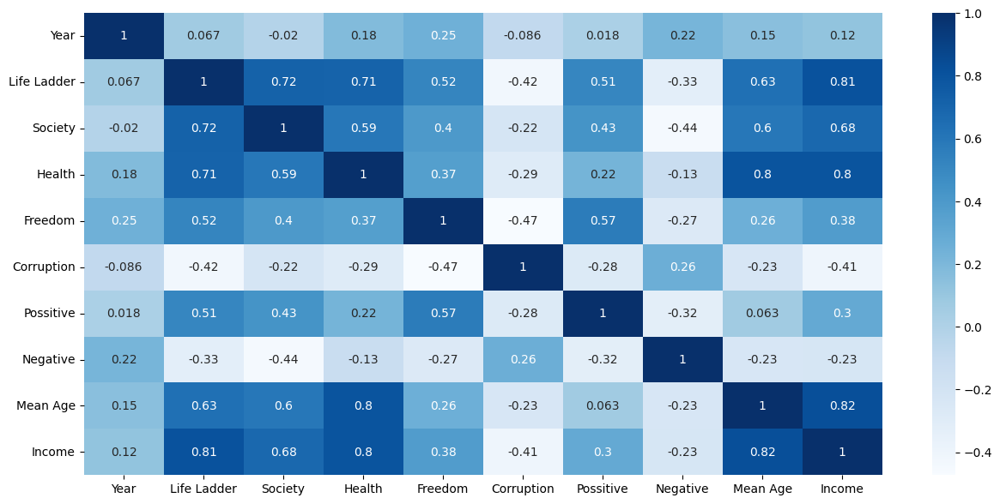

In [ ]:
corr_matrix = df.corr(numeric_only=True)
plt.figure(figsize= (15,7))
sns.heatmap(corr_matrix, annot=True, cmap='Blues')

# plt.savefig("heat_map.png")
# files.download("heat_map.png")

Conclusion: Income has the largest impact on Life Ladder. We prioritize analysis insight into Income.

*   How much does income impact on happiness levels?
*   Whether The lower the corruption, the happier?
*   Additionally, a few main factors influence happiness scores such as GDP, health, society, and Age. We need to explore further datasets and show a correlation between the factors.
*   If anyone work in harmful environment with handsome salary, they are happy? => explore a correlation between GDP and Age
*   GDP of developemnt countries => increase steadily through a single year => people feel happier than previous time ??

We will gain insight into data in a next chapter!!










## III. Insights

#### 0/ Overview detail each group


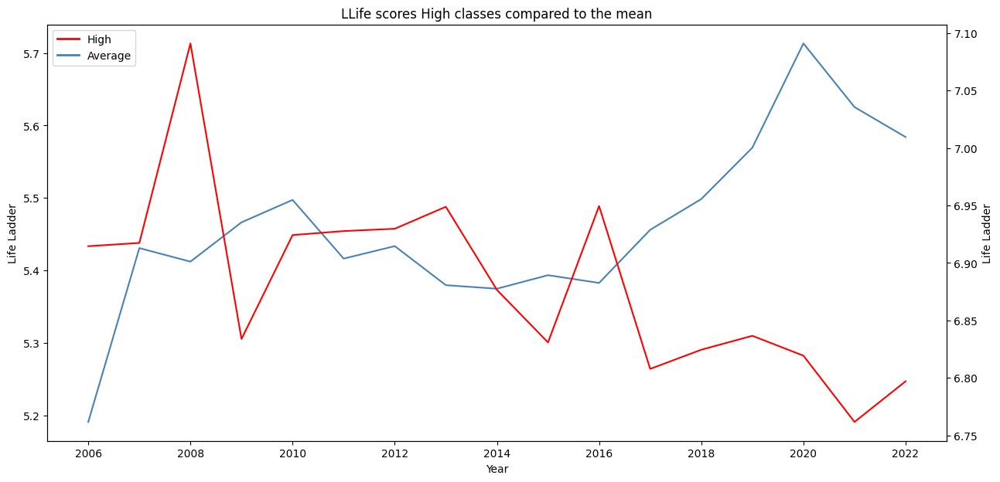

In [ ]:
df1 = df.groupby("Year").mean(numeric_only=True).reset_index()
df2 = df[df["Rank"] == "High"].groupby("Year").mean(numeric_only=True).reset_index()

plt.figure(figsize =(15,7))
plt.title("LLife scores High classes compared to the mean")
sns.lineplot(data= df1, x= "Year", y="Life Ladder", color="steelblue")
plt.twinx()
sns.lineplot(data= df2, x= "Year", y="Life Ladder", color="r")
legend_elements = [
    plt.Line2D([0], [0], color='r', lw=2, label='High'),
    plt.Line2D([0], [0], color='steelblue', lw=2, label='Average')]
plt.legend(handles=legend_elements, loc='upper left')
plt.show()

# plt.savefig("life_high+mean.png")
# files.download("life_high+mean.png")

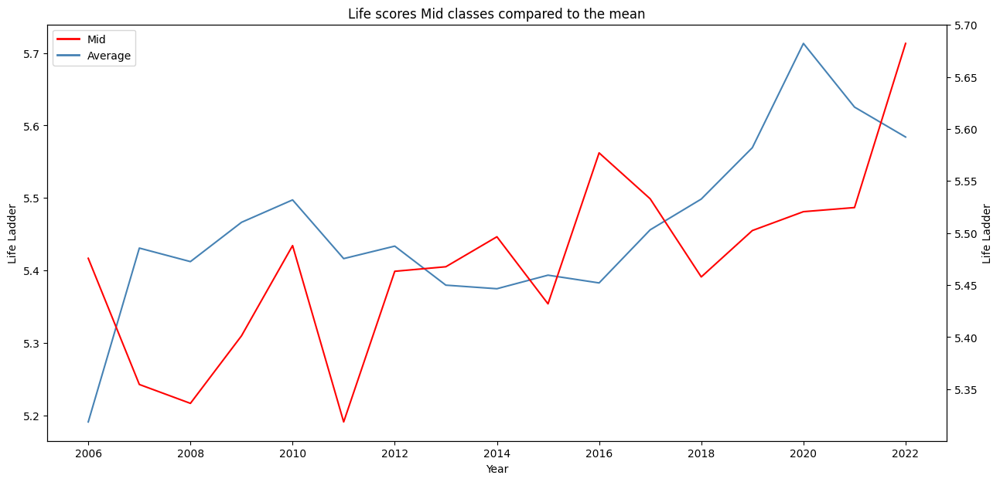

In [ ]:
df1 = df.groupby("Year").mean(numeric_only=True).reset_index()
df2 = df[df["Rank"] == "Mid"].groupby("Year").mean(numeric_only=True).reset_index()

plt.figure(figsize =(15,7))
plt.title("Life scores Mid classes compared to the mean")
sns.lineplot(data= df1, x= "Year", y="Life Ladder", color="steelblue")
plt.twinx()
sns.lineplot(data= df2, x= "Year", y="Life Ladder", color="r")
legend_elements = [
    plt.Line2D([0], [0], color='r', lw=2, label='Mid'),
    plt.Line2D([0], [0], color='steelblue', lw=2, label='Average')]
plt.legend(handles=legend_elements, loc='upper left')
plt.show()

# plt.savefig("plot_scatter_income+life.png")
# files.download("plot_scatter_income+life.png")

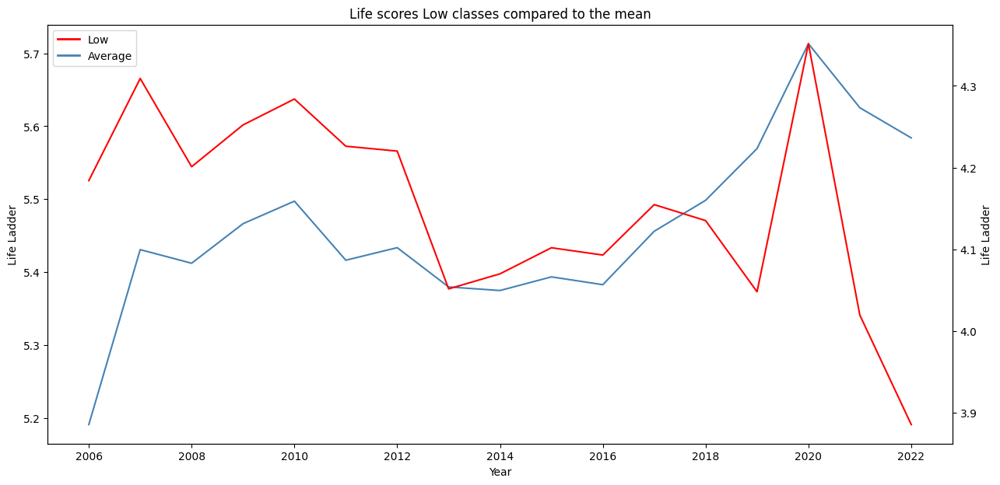

In [ ]:
df1 = df.groupby("Year").mean(numeric_only=True).reset_index()
df2 = df[df["Rank"] == "Low"].groupby("Year").mean(numeric_only=True).reset_index()

plt.figure(figsize =(15,7))
plt.title("Life scores Low classes compared to the mean")
sns.lineplot(data= df1, x= "Year", y="Life Ladder", color="steelblue")
plt.twinx()
sns.lineplot(data= df2, x= "Year", y="Life Ladder", color="r")
legend_elements = [
    plt.Line2D([0], [0], color='r', lw=2, label='Low'),
    plt.Line2D([0], [0], color='steelblue', lw=2, label='Average')]
plt.legend(handles=legend_elements, loc='upper left')

# plt.savefig("life_low+mean.png")
# files.download("life_low+mean.png")

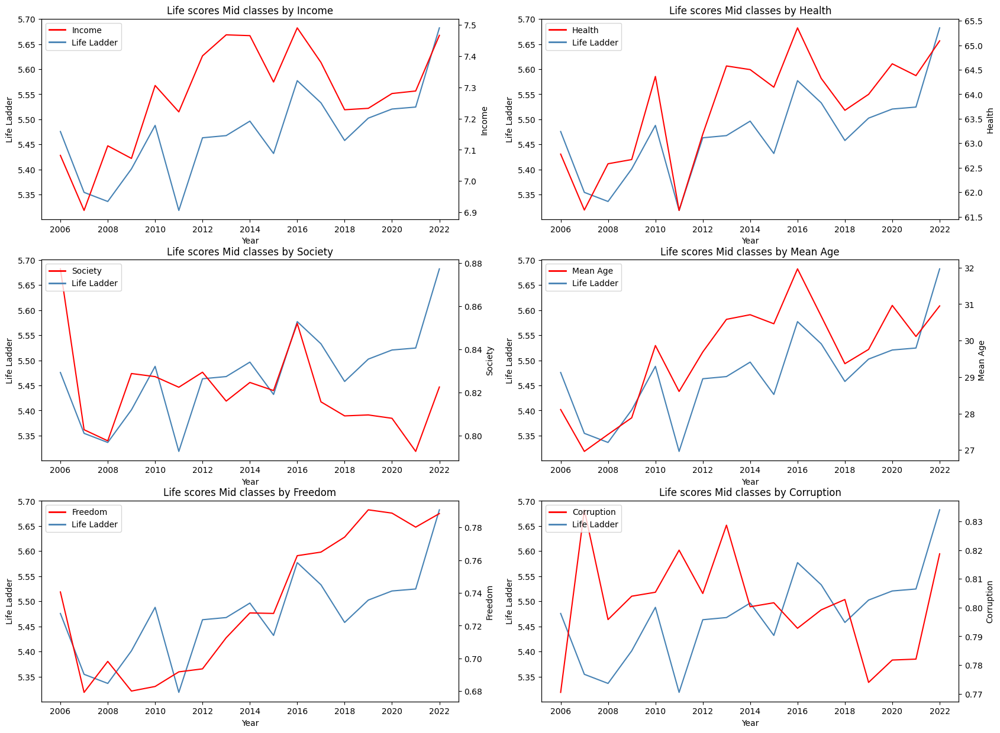

In [ ]:
# The Mid class correlation of other factors
factors = {"Income":1, "Health":2, "Society":3, "Mean Age":4, "Freedom":5, "Corruption":6}
df2 = df[df["Rank"] == "Mid"].groupby("Year").mean(numeric_only=True).reset_index()

plt.figure(figsize =(20,15))

for i in factors:
  plt.subplot(320+ factors[i])
  plt.title(f"Life scores Mid classes by {i}")
  sns.lineplot(data= df2, x= "Year", y="Life Ladder", color="steelblue")
  plt.twinx()
  sns.lineplot(data= df2, x= "Year", y= i, color="r")
  legend_elements = [
      plt.Line2D([0], [0], color='r', lw=2, label=i),
      plt.Line2D([0], [0], color='steelblue', lw=2, label='Life Ladder')]
  plt.legend(handles=legend_elements, loc='upper left')
plt.show()

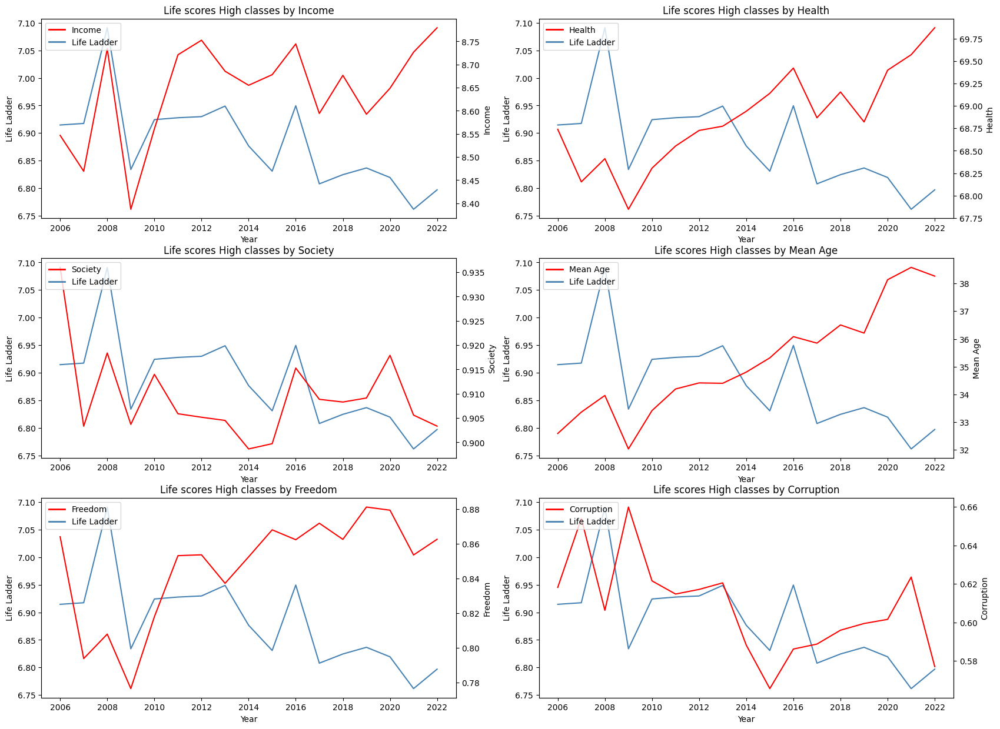

In [ ]:
# The High class correlation of other factors
factors = {"Income":1, "Health":2, "Society":3, "Mean Age":4, "Freedom":5, "Corruption":6}
df2 = df[df["Rank"] == "High"].groupby("Year").mean(numeric_only=True).reset_index()

plt.figure(figsize =(20,15))

for i in factors:
  plt.subplot(320+ factors[i])
  plt.title(f"Life scores High classes by {i}")
  sns.lineplot(data= df2, x= "Year", y="Life Ladder", color="steelblue")
  plt.twinx()
  sns.lineplot(data= df2, x= "Year", y= i, color="r")
  legend_elements = [
      plt.Line2D([0], [0], color='r', lw=2, label=i),
      plt.Line2D([0], [0], color='steelblue', lw=2, label='Life Ladder')]
  plt.legend(handles=legend_elements, loc='upper left')
plt.show()

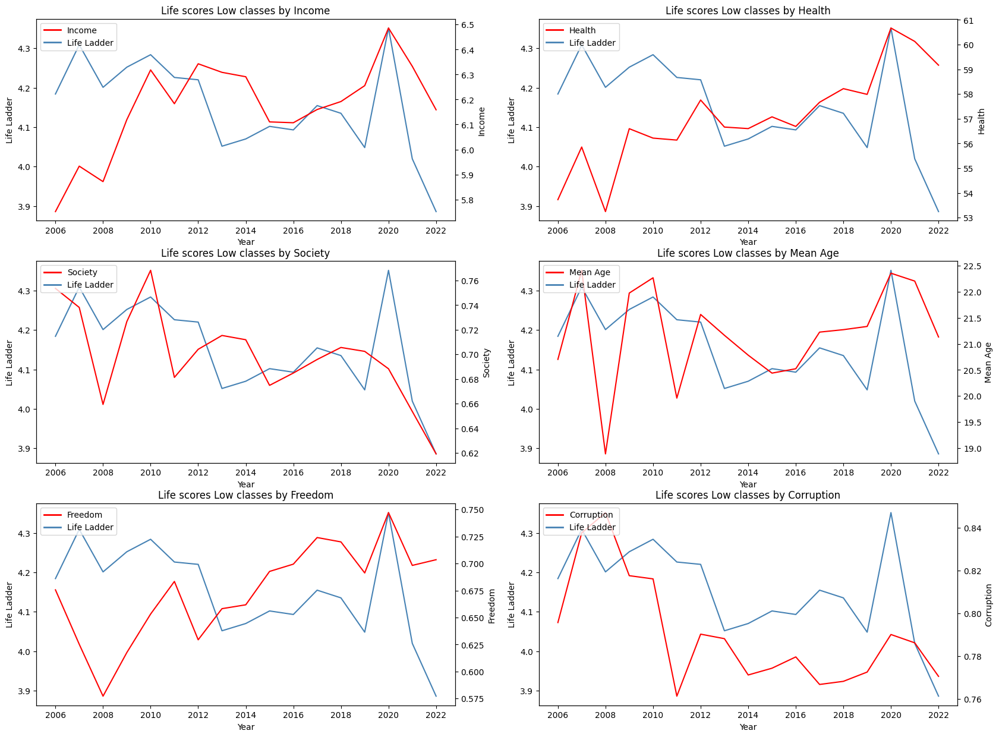

In [ ]:
# The Low class correlation of other factors
factors = {"Income":1, "Health":2, "Society":3, "Mean Age":4, "Freedom":5, "Corruption":6}
df2 = df[df["Rank"] == "Low"].groupby("Year").mean(numeric_only=True).reset_index()

plt.figure(figsize =(20,15))

for i in factors:
  plt.subplot(320+ factors[i])
  plt.title(f"Life scores Low classes by {i}")
  sns.lineplot(data= df2, x= "Year", y="Life Ladder", color="steelblue")
  plt.twinx()
  sns.lineplot(data= df2, x= "Year", y= i, color="r")
  legend_elements = [
      plt.Line2D([0], [0], color='r', lw=2, label= i),
      plt.Line2D([0], [0], color='steelblue', lw=2, label='Life Ladder')]
  plt.legend(handles=legend_elements, loc='upper left')


We witnessed the above two reductions in happiness levels of the Low and High classes do not have much impact on money:
* High class: Mean Age & Society impact on dowtrend of tendency
* Low: Society plays an important role in the decline

###1/ **Does money buy happiness?**


The graphs experienced us correlation between Income and Life Ladder. Although Income and Life Ladder increased steaddily by years, a lot of countries showed High-income people to be not sure happy rather than people low-income


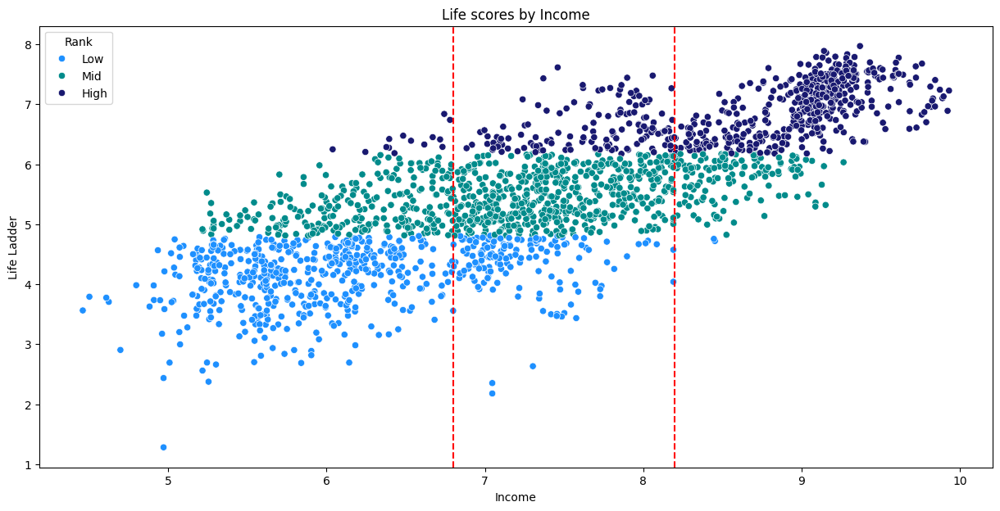

In [ ]:
# Scatter plot of countries' happiness levels by Income

plt.figure(figsize =(15,7))
plt.title("Life scores by Income")
sns.scatterplot(data= df, x= "Income", y="Life Ladder", hue= "Rank", palette= color_b)
plt.axvline(x= 6.8, color='r', linestyle="--")
plt.axvline(x= 8.2, color='r', linestyle="--")
plt.show()

# plt.savefig("plot_scatter_income+life.png")
# files.download("plot_scatter_income+life.png")

**Take range values income from 6.8 - 8.2 to explore data**

* In a lot of countries Mid class has an income from 8 - 9, but unhappy as much as High class has an income from 7- 8
* Low classes have an income from 7 - 8 less happy Mid Classes income 5.5 - 7

Although a small group has an income from 6.2 to 8.2, the happiness levels are different.

In [ ]:
# Choose df0 are datasets that have income range(6.8,8.2)

df0 = df[(df["Income"] > 6.8) & (df["Income"] < 8.2)]
df0.head()

,Country,Year,Life Ladder,Society,Health,Freedom,Corruption,Possitive,Negative,Mean Age,Income,Rank
14,Albania,2007,4.634252,0.821372,66.760002,0.528605,0.874700,0.488819,0.246335,30.4,6.928257,Low
15,Albania,2009,5.485470,0.833047,67.320000,0.525223,0.863665,0.564474,0.279257,31.6,7.042390,Mid
16,Albania,2010,5.268937,0.733152,67.599998,0.568958,0.726262,0.576077,0.300060,32.3,7.038311,Mid
17,Albania,2011,5.867422,0.759434,67.879997,0.487496,0.877003,0.565759,0.256577,32.8,7.106349,Mid
18,Albania,2012,5.510124,0.784502,68.160004,0.601512,0.847675,0.553473,0.271393,33.3,7.069412,Mid


In [ ]:
# The ratio of df0
df0.shape[0]/df.shape[0]

0.38097447795823663

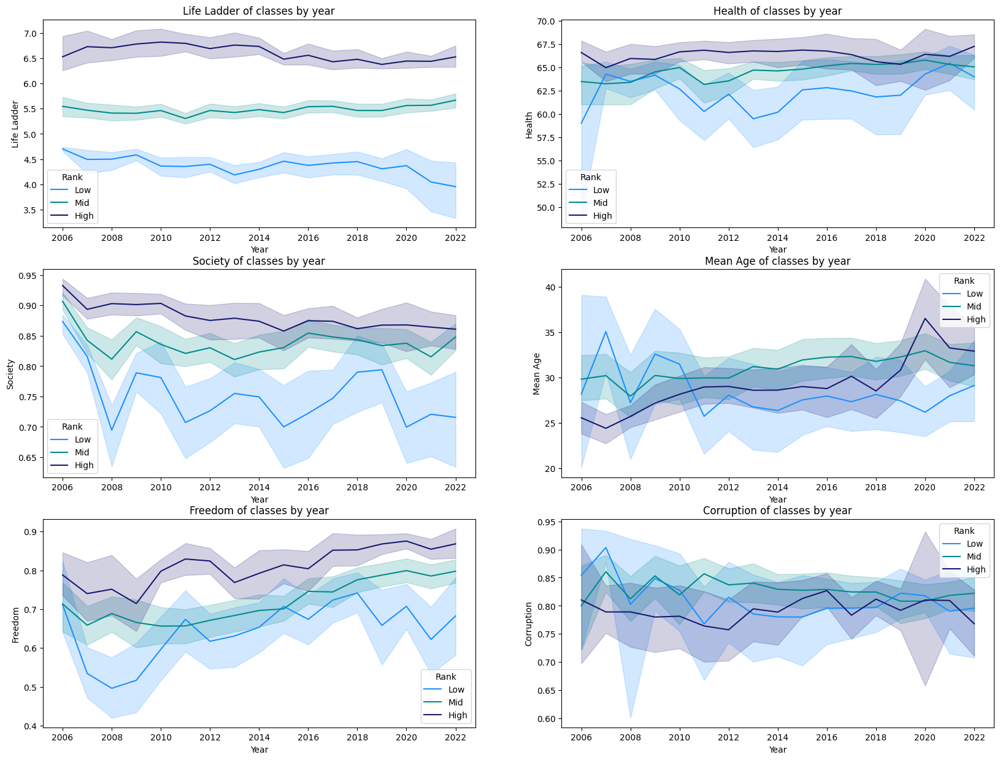

In [ ]:
# The change of income range(6.2,8.2) interact factors
color_b = ["dodgerblue", "darkcyan","midnightblue"]
factors = {"Life Ladder":1, "Health":2, "Society":3, "Mean Age":4, "Freedom":5, "Corruption":6}

plt.figure(figsize =(20,15))
for i in factors:
  plt.subplot(320+ factors[i])
  plt.title(f"{i} of classes by year")
  sns.lineplot(data= df0, x= "Year", y= i, hue="Rank", palette= color_b)

# plt.savefig("Income_by_factors.png")
# files.download("Income_by_factors.png")

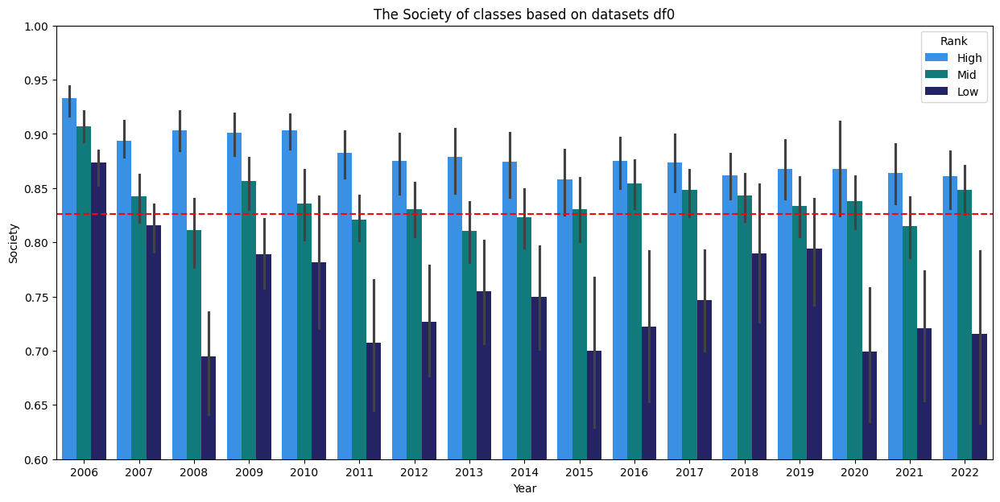

In [ ]:
color_b = ["dodgerblue", "darkcyan","midnightblue"]
plt.figure(figsize =(15,7))

plt.title("The Society of classes based on datasets df0")
sns.barplot(data= df0, x= "Year", y="Society", hue="Rank", palette= color_b, hue_order=["High", "Mid", "Low"])
plt.ylim(0.6,1)
plt.axhline(y= df0["Society"].mean(), color='r', linestyle="--")
plt.show()

# plt.savefig("Society_class_year_1.png")
# files.download("Society_class_year_1.png")

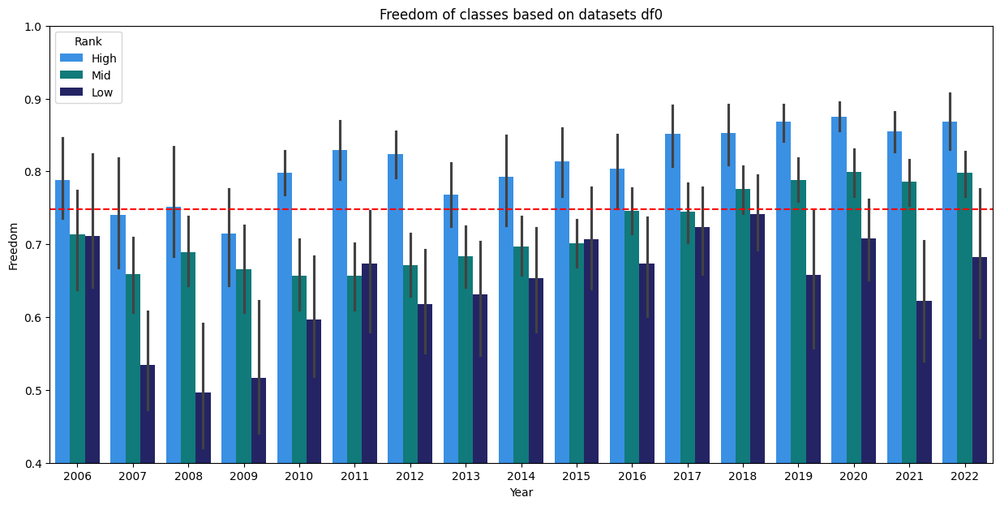

In [ ]:
color_b = ["dodgerblue", "darkcyan","midnightblue"]
plt.figure(figsize =(15,7))

plt.title("Freedom of classes based on datasets df0")
sns.barplot(data= df0, x= "Year", y="Freedom", hue="Rank", palette= color_b, hue_order=["High", "Mid", "Low"])
plt.ylim(0.4,1)
plt.axhline(y= df["Freedom"].mean(), color='r', linestyle="--")
plt.show()

# plt.savefig("Freedom_class_year_1.png")
# files.download("Freedom_class_year_1.png")

Conclusion df0 datasets: Money don't buy happiness => although money really essential in lives, it is not all things

**Generating df1 datasets beyond income range(6.8,8.2) to gain insight into datasets:**

In [ ]:
df1 = df[(df["Income"] < 6.8) | (df["Income"] > 8.2)]
df1.shape[0] / df.shape[0]

0.6190255220417633

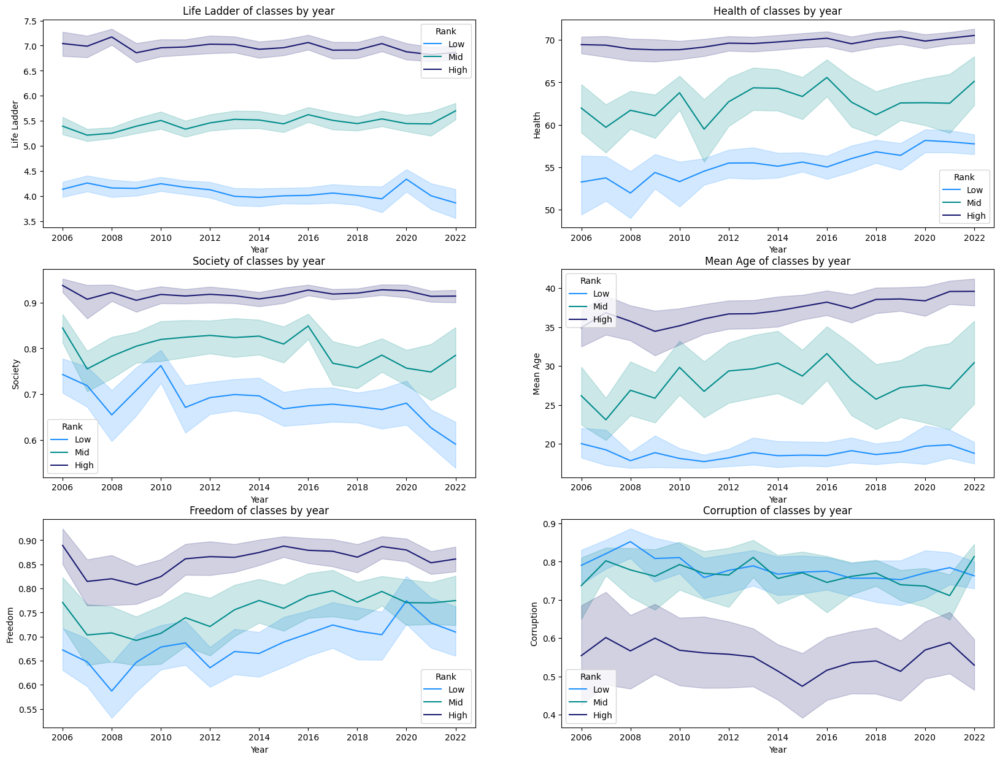

In [ ]:
color_b = ["dodgerblue", "darkcyan","midnightblue"]
factors = {"Life Ladder":1, "Health":2, "Society":3, "Mean Age":4, "Freedom":5, "Corruption":6}

plt.figure(figsize =(20,15))
for i in factors:
  plt.subplot(320+ factors[i])
  plt.title(f"{i} of classes by year")
  sns.lineplot(data= df1, x= "Year", y= i, hue="Rank", palette= color_b)
plt.show()
# plt.savefig("Income_by_factors_2.png")
# files.download("Income_by_factors_2.png")

Concusion: The percentages of df1 constitute more than 61%. The high-income experienced most features such as a high life ladder, a high society, and low corruption. In contrast, low-income live in bad conditions.

### 2/ Health

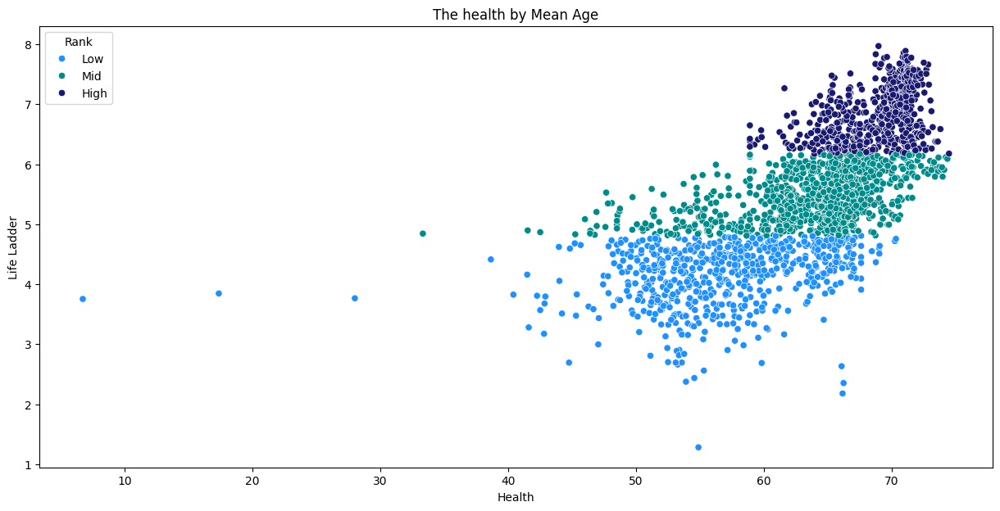

In [ ]:
# The charts illustrate the correlation between health and Life ladder
plt.figure(figsize =(15,7))
plt.title("The health by Mean Age")
sns.scatterplot(data= df, x= "Health", y="Life Ladder", hue= "Rank", palette= color_b)
plt.show()


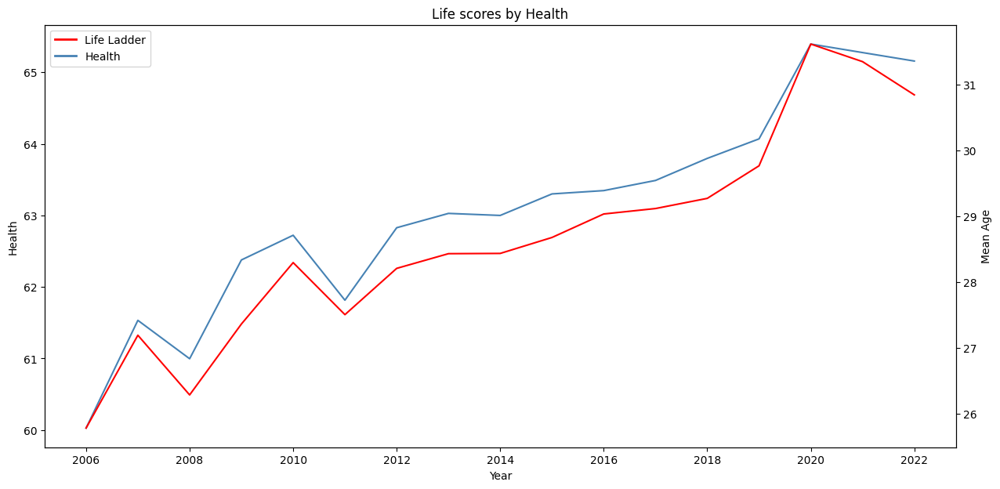

In [ ]:
df1 = df.groupby("Year").mean(numeric_only = True).reset_index()

plt.figure(figsize =(15,7))

plt.title("Life scores by Health")
sns.lineplot(data= df1, x= "Year", y="Health", color="steelblue")
plt.twinx()
sns.lineplot(data= df1, x= "Year", y="Mean Age", color="r")
legend_elements = [
    plt.Line2D([0], [0], color='r', lw=2, label='Life Ladder'),
    plt.Line2D([0], [0], color='steelblue', lw=2, label='Health')]
plt.legend(handles=legend_elements, loc='upper left')

plt.show()

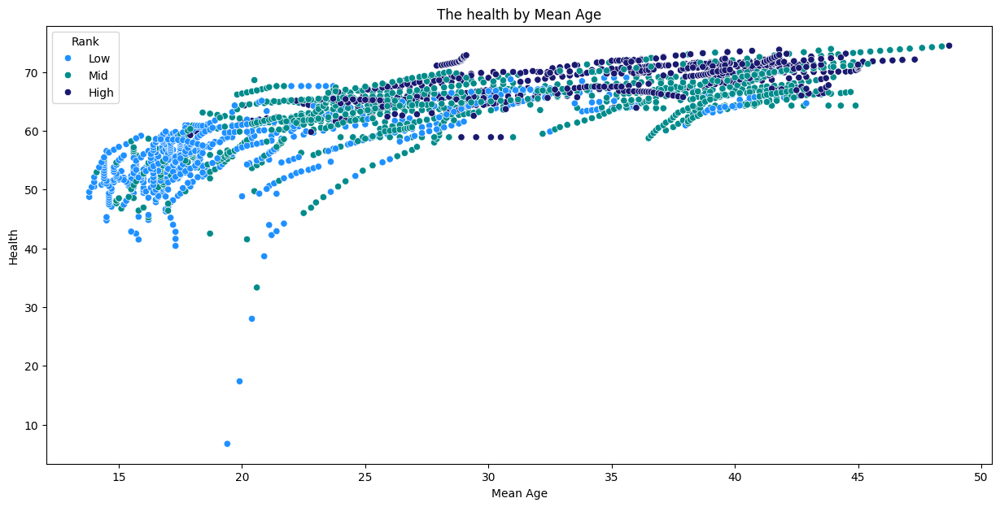

In [ ]:
# The charts illustrate the correlation between health and mean age
plt.figure(figsize =(15,7))
plt.title("The health by Mean Age")
sns.scatterplot(data= df, y= "Health", x="Mean Age", hue= "Rank", palette= color_b)

plt.show()

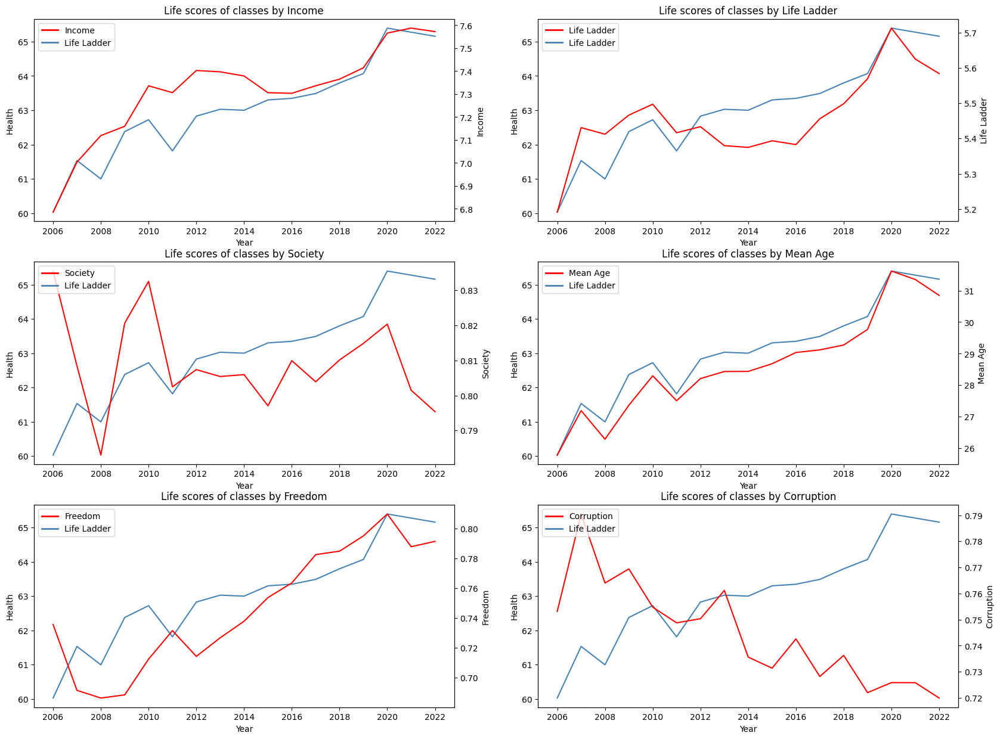

In [ ]:
factors = {"Income":1, "Life Ladder":2, "Society":3, "Mean Age":4, "Freedom":5, "Corruption":6}
df2 = df.groupby("Year").mean(numeric_only = True).reset_index()

plt.figure(figsize =(20,15))
for i in factors:
  plt.subplot(320+ factors[i])
  plt.title(f"Life scores of classes by {i}")
  sns.lineplot(data= df2, x= "Year", y="Health", color="steelblue")
  plt.twinx()
  sns.lineplot(data= df2, x= "Year", y= i, color="r")
  legend_elements = [
      plt.Line2D([0], [0], color='r', lw=2, label= i),
      plt.Line2D([0], [0], color='steelblue', lw=2, label='Life Ladder')]
  plt.legend(handles=legend_elements, loc='upper left')
plt.show()

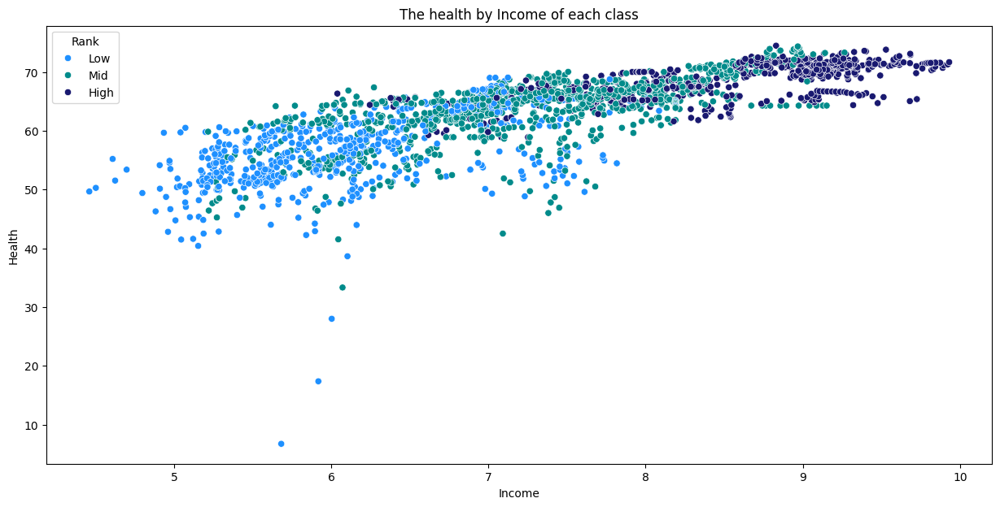

In [ ]:
# The graph show the correlation between health and income
plt.figure(figsize =(15,7))
plt.title("The health by Income of each class")
sns.scatterplot(data= df, x= "Income", y="Health", hue= "Rank", palette= color_b)

plt.show()

In general, health has improved over the years. Health across countries is not too clearly differentiated between classes. Of course, low health will always be lower than that of happy countries, but in general it does not reflect too much.

### 3/ How much Society and Freedom impact on Happiness?

#### **Society**

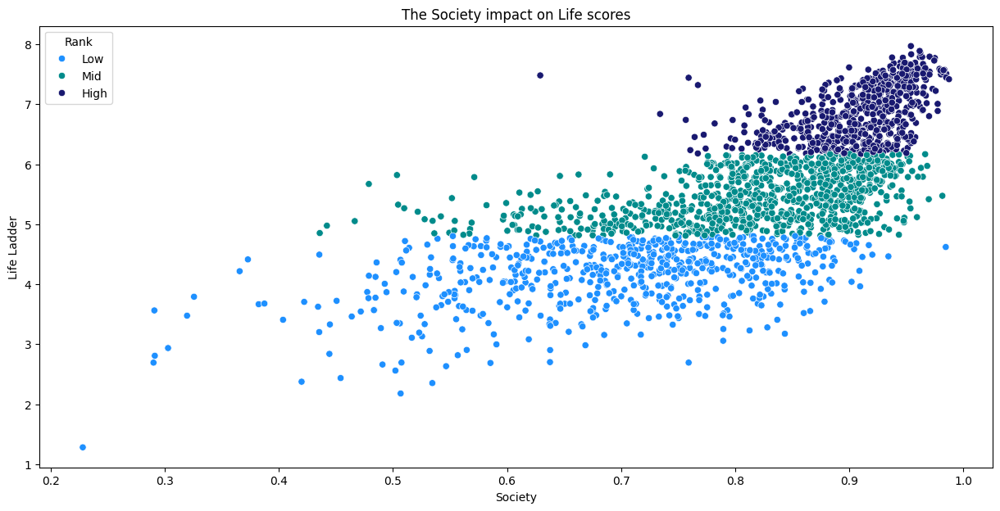

In [ ]:
plt.figure(figsize =(15,7))
plt.title("The Society impact on Life scores")
sns.scatterplot(data= df, x= "Society", y="Life Ladder", hue= "Rank", palette= color_b)
plt.show()

# plt.savefig("Society_Life.png")
# files.download("Society_Life.png")

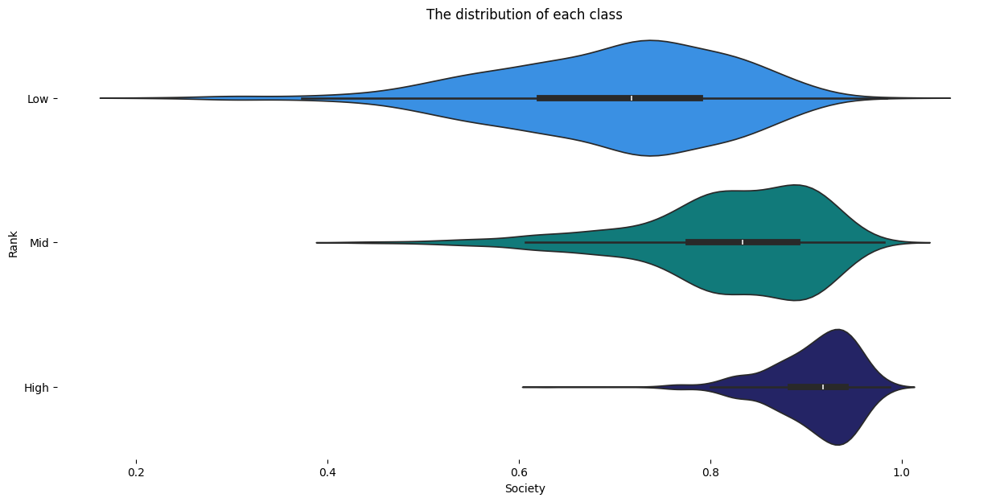

In [ ]:
figsize = (12, 1.2 * len(df['Rank'].unique()))
plt.figure(figsize=(15,7))
sns.violinplot(df, x='Society', y='Rank', inner='box', palette= color_b, hue_order=["High", "Mid", "Low"])
plt.title("The distribution of each class")
sns.despine(top=True, right=True, bottom=True, left=True)

# plt.savefig("Society_Rank.png")
# files.download("Society_Rank.png")

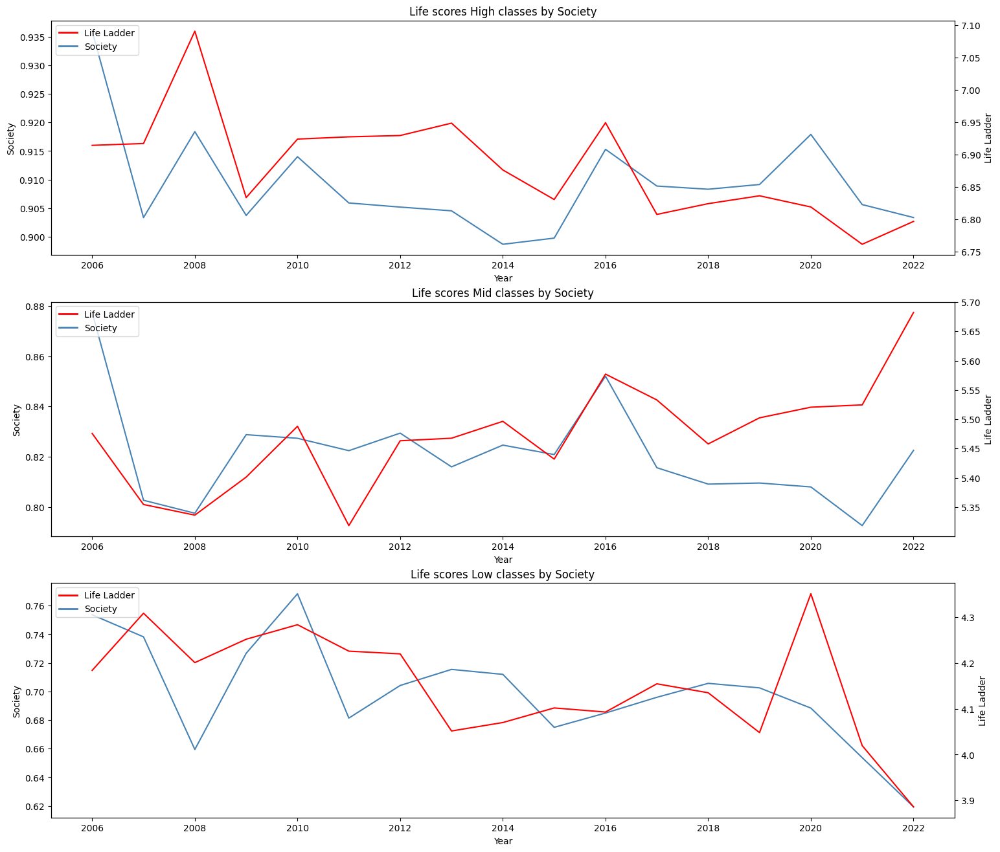

In [ ]:
# The change each class
factors = {"High":1, "Mid":2, "Low":3}
plt.figure(figsize =(18,16))
for i in factors:
  df1 = df[df["Rank"] == i].groupby("Year").mean(numeric_only=True).reset_index()
  plt.subplot(310 + factors[i])
  plt.title(f"Life scores {i} classes by Society")
  sns.lineplot(data= df1, x= "Year", y="Society", color="steelblue")
  plt.twinx()
  sns.lineplot(data= df1, x= "Year", y="Life Ladder", color="r")
  legend_elements = [
      plt.Line2D([0], [0], color='r', lw=2, label='Life Ladder'),
      plt.Line2D([0], [0], color='steelblue', lw=2, label='Society')]
  plt.legend(handles=legend_elements, loc='upper left')
plt.show()

# plt.savefig("Society_High+Low.png")
# files.download("Society_High+Low.png")


*   Society has a high level, the proportion of society fluctuated slightly from 93% in 2006 to 91% in 2022.
*   Society have the lowest levels, the proportion of Socirty fluctuated significantly between 72% in 2006 to 62% at 2022 => Denlta = 10%.

Similar to The pandemic Covid-19

#### **Freedom**

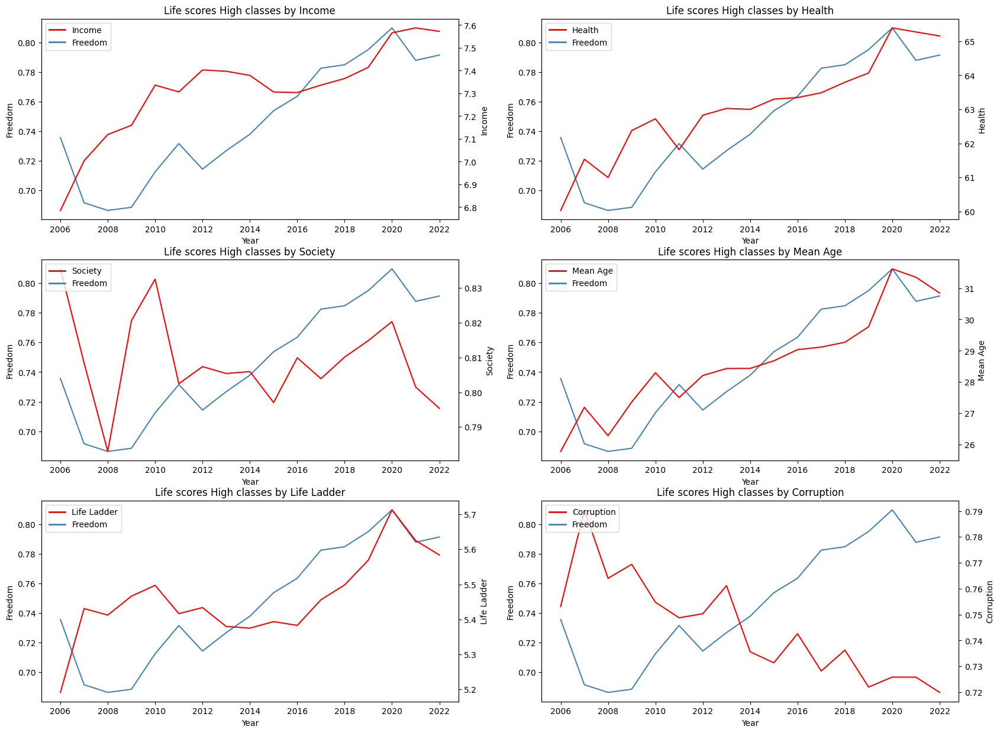

In [ ]:
factors = {"Income":1, "Health":2, "Society":3, "Mean Age":4, "Life Ladder":5, "Corruption":6}
df2 = df.groupby("Year").mean(numeric_only= True).reset_index()

plt.figure(figsize =(20,15))

for i in factors:
  plt.subplot(320+ factors[i])
  plt.title(f"Life scores High classes by {i}")
  sns.lineplot(data= df2, x= "Year", y="Freedom", color="steelblue")
  plt.twinx()
  sns.lineplot(data= df2, x= "Year", y= i, color="r")
  legend_elements = [
      plt.Line2D([0], [0], color='r', lw=2, label=i),
      plt.Line2D([0], [0], color='steelblue', lw=2, label='Freedom')]
  plt.legend(handles=legend_elements, loc='upper left')

plt.show()

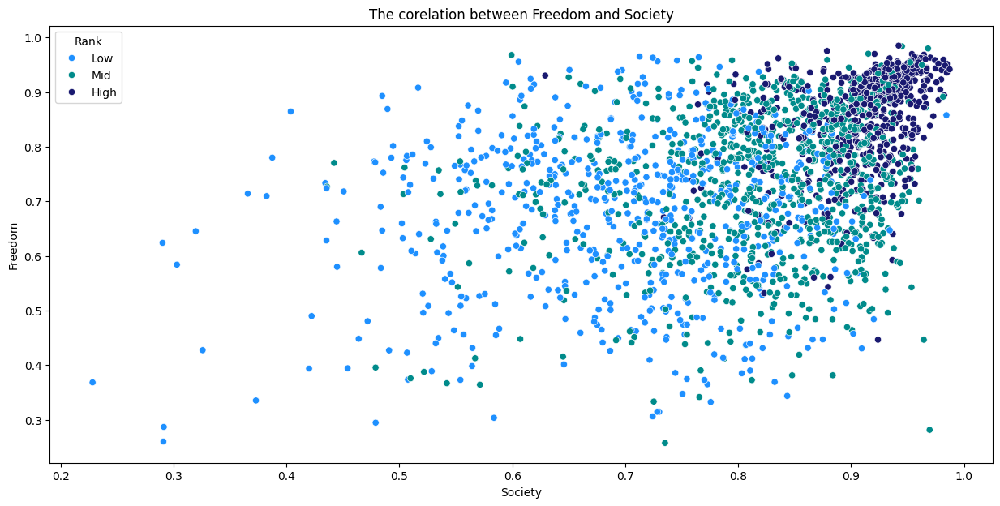

In [ ]:
plt.figure(figsize =(15,7))
plt.title("The corelation between Freedom and Society")
sns.scatterplot(data= df, x= "Society", y="Freedom", hue= "Rank", palette= color_b)
plt.show()

# plt.savefig("Freedom_Society.png")
# files.download("Freedom_Society.png")

### 4/ Age

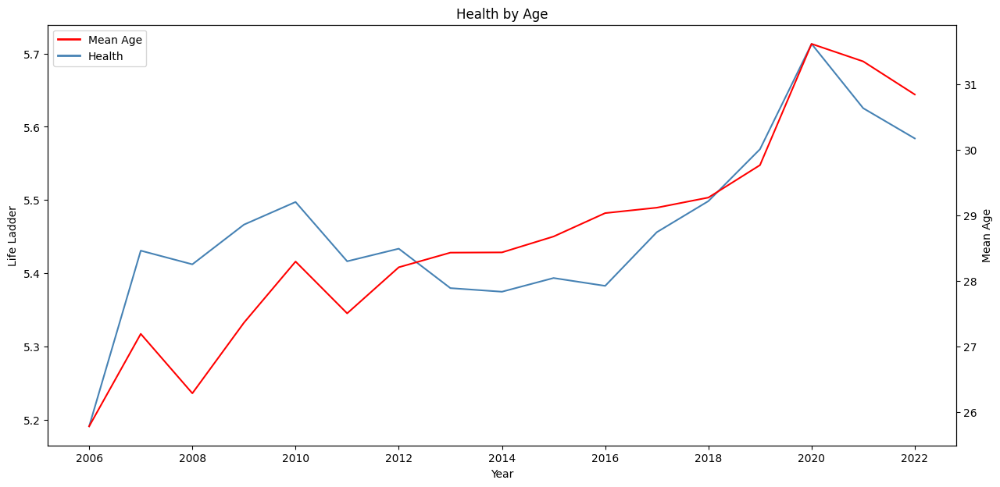

In [ ]:
df1 = df.groupby("Year").mean(numeric_only=True).reset_index()

plt.figure(figsize =(15,7))
plt.title("Health by Age")
sns.lineplot(data= df1, x= "Year", y="Life Ladder", color="steelblue")
plt.twinx()
sns.lineplot(data= df1, x= "Year", y="Mean Age", color="r")
legend_elements = [
    plt.Line2D([0], [0], color='r', lw=2, label='Mean Age'),
    plt.Line2D([0], [0], color='steelblue', lw=2, label='Health')]
plt.legend(handles=legend_elements, loc='upper left')

plt.show()
# plt.savefig("Health_Age.png")
# files.download("Health_Age.png")

(15.0, 40.0)

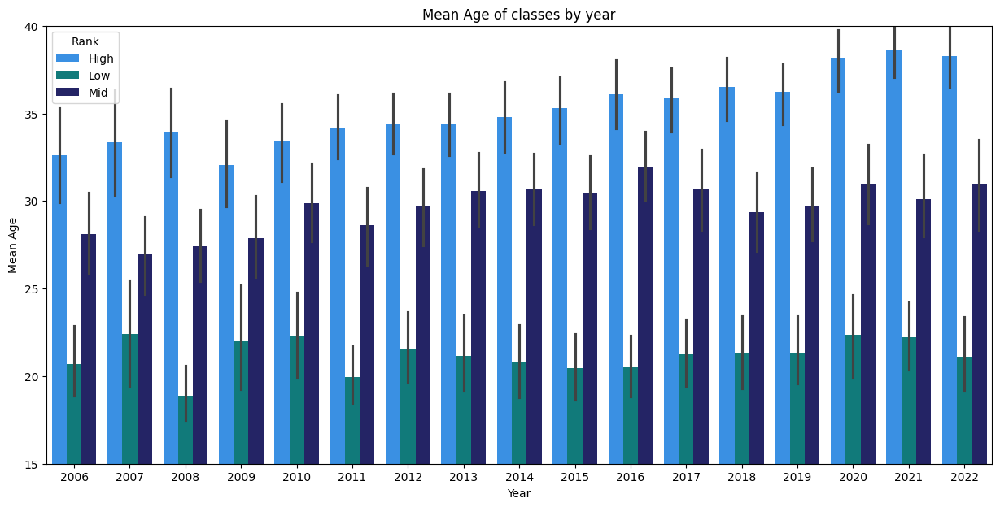

In [ ]:
color_b = ["dodgerblue", "darkcyan","midnightblue"]
plt.figure(figsize =(15,7))

plt.title("Mean Age of classes by year")
sns.barplot(data= df, x= "Year", y="Mean Age", hue="Rank", palette= color_b)
plt.ylim(15,40)

# plt.savefig("Mean Age_class.png")
# files.download("Mean Age_class.png")

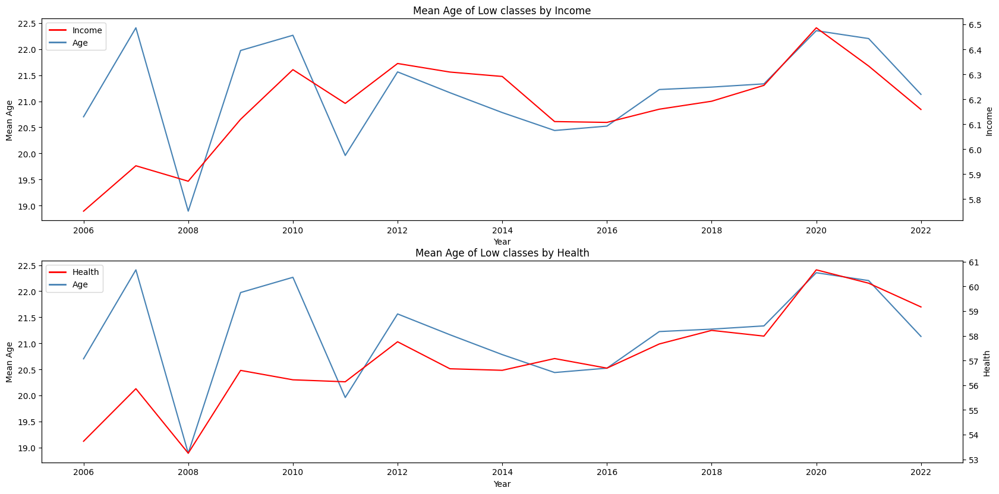

In [ ]:
factors = {"Income":1, "Health":2}
df2 = df[df["Rank"] == "Low"].groupby("Year").mean(numeric_only=True).reset_index()

plt.figure(figsize =(20,15))

for i in factors:
  plt.subplot(310+ factors[i])
  plt.title(f"Mean Age of Low classes by {i}")
  sns.lineplot(data= df2, x= "Year", y="Mean Age", color="steelblue")
  plt.twinx()
  sns.lineplot(data= df2, x= "Year", y= i, color="r")
  legend_elements = [
      plt.Line2D([0], [0], color='r', lw=2, label=i),
      plt.Line2D([0], [0], color='steelblue', lw=2, label='Age')]
  plt.legend(handles=legend_elements, loc='upper left')
plt.show()

The older people are the better their health because they have more money to take care of their health. When they were young, they had to work to make money. This is a natural cycle of life.

### 5/ Corruption

<Axes: title={'center': 'Income and Corruption'}, xlabel='Income', ylabel='Corruption'>

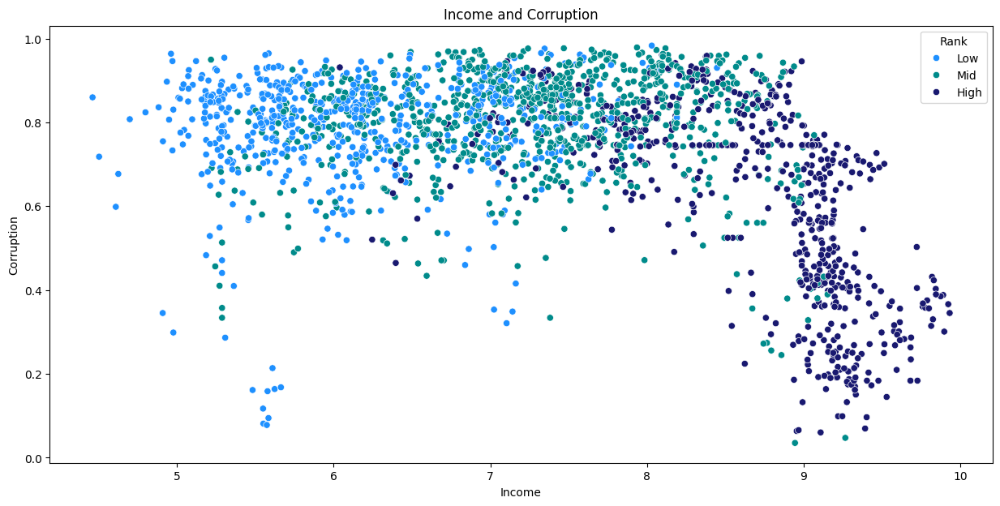

In [ ]:
plt.figure( figsize=(15,7))
plt.title("Income and Corruption")
sns.scatterplot(data= df, x="Income", y="Corruption", hue="Rank", palette= color_b)

# plt.savefig("Income.png")
# files.download("Happiness_Age.png")

<Axes: title={'center': 'The cuprruption rates each classes'}, xlabel='Year', ylabel='Corruption'>

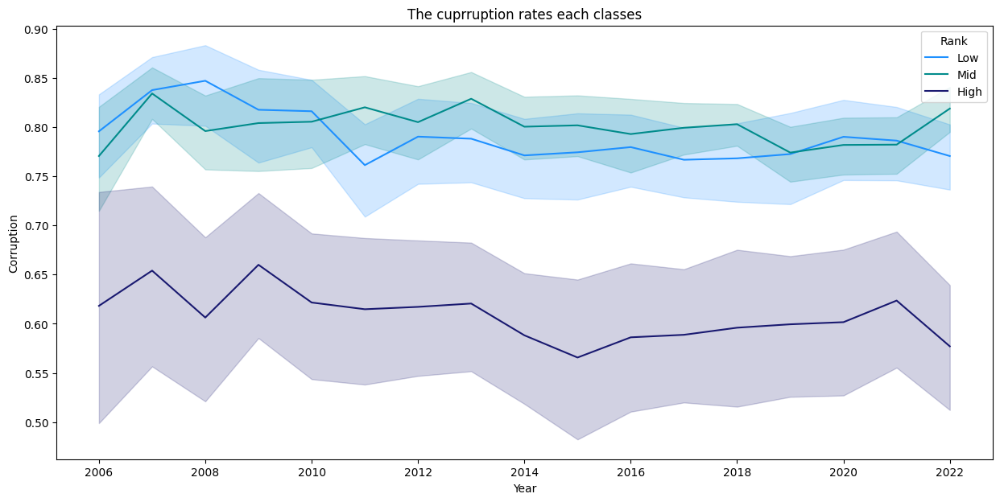

In [ ]:
plt.figure(figsize=(15,7))

plt.title("The cuprruption rates each classes")
sns.lineplot(df, x="Year", y= "Corruption", hue="Rank", palette=color_b)

# plt.savefig("Corruption_year.png")
# files.download("Corruption_year.png")

Most countries have high incomes, which maintains the low corruption

### 6/ How to improve happiness scores?

In [ ]:
df.sort_values(by ="Life Ladder", ascending = False)[:10]

,Country,Year,Life Ladder,Society,Health,Freedom,Corruption,Possitive,Negative,Mean Age,Income,Rank
514,Denmark,2008,7.970892,0.953912,68.959999,0.969788,0.247505,0.759462,0.163091,39.2,9.369047,High
641,Finland,2020,7.889350,0.961621,71.074997,0.962424,0.163636,0.747939,0.192898,42.2,9.141732,High
639,Finland,2018,7.858107,0.962155,70.925003,0.937807,0.198605,0.748826,0.181781,41.8,9.155692,High
513,Denmark,2007,7.834233,0.954201,68.739998,0.932086,0.206006,0.777936,0.194324,39.0,9.288574,High
642,Finland,2021,7.794378,0.970289,71.150002,0.963190,0.191754,0.751612,0.175449,42.4,9.213230,High
638,Finland,2017,7.788252,0.963826,70.849998,0.962199,0.192413,0.755858,0.176066,41.6,9.092891,High
517,Denmark,2011,7.788232,0.961736,69.620003,0.934760,0.220043,0.777892,0.174883,39.7,9.334564,High
640,Finland,2019,7.780348,0.937416,71.000000,0.947617,0.195338,0.732282,0.180733,42.0,9.132389,High
1857,Switzerland,2012,7.776209,0.946864,71.519997,0.945428,0.323241,0.792705,0.176007,40.9,9.613214,High
516,Denmark,2010,7.770515,0.974977,69.400002,0.943631,0.174896,0.796209,0.154563,39.6,9.282102,High


In [ ]:
df.sort_values(by ="Life Ladder", ascending = True)[:10]

,Country,Year,Life Ladder,Society,Health,Freedom,Corruption,Possitive,Negative,Mean Age,Income,Rank
13,Afghanistan,2022,1.281271,0.228217,54.875000,0.368377,0.733198,0.205868,0.575512,16.9,4.970950,Low
1113,Lebanon,2021,2.178809,0.506775,66.150002,0.422697,0.905279,0.263487,0.569101,28.3,7.046905,Low
1114,Lebanon,2022,2.352428,0.534528,66.224998,0.449575,0.882996,0.297508,0.429903,28.5,7.046905,Low
11,Afghanistan,2019,2.375092,0.419973,53.900002,0.393656,0.923849,0.324108,0.502474,16.3,5.255088,Low
12,Afghanistan,2021,2.436034,0.454175,54.549999,0.394306,0.946299,0.178886,0.606713,16.7,4.970950,Low
1700,Sierra Leone,2022,2.560430,0.502168,55.299999,0.659596,0.861837,0.493701,0.504607,19.0,5.216930,Low
1112,Lebanon,2020,2.633753,0.546600,66.074997,0.551601,0.883977,0.352249,0.481800,28.0,7.303305,Low
9,Afghanistan,2017,2.661718,0.490880,53.250000,0.427011,0.954393,0.435270,0.371326,16.0,5.302043,Low
1872,Syria,2013,2.687553,0.585450,59.820000,0.454883,0.663431,0.353619,0.622230,20.2,5.840160,Low
343,Central African Republic,2016,2.693061,0.290184,44.750000,0.624057,0.859073,0.550785,0.494268,14.5,5.008988,Low


How to improve happiness levels in a country?

In [ ]:
df[(df["Year"]==2022) & (df["Country"] == "Vietnam")]["Life Ladder"]

2140    6.266509
Name: Life Ladder, dtype: float64

In [ ]:
# The ratio of countries fluctuate between 2022 and 2006
x = df["Country"].unique()
dic = {}
for i in x:
    try:
        dic[i] = ((df[df["Year"]==2022].loc[df["Country"] == i, "Life Ladder"].values[0]
        - df[df["Year"]==2006].loc[df["Country"] ==i, "Life Ladder"].values[0])/
                  df[df["Year"]==2006].loc[df["Country"] ==i, "Life Ladder"].values[0])
    except IndexError:
        # Handle the case where there is no data for the country in either year.
        pass
dic

{'Argentina': -0.008226274710397122,
 'Armenia': 0.254733646999551,
 'Austria': -0.017299998125379946,
 'Bangladesh': -0.21102017144196536,
 'Benin': 0.26653964571608596,
 'Bolivia': 0.1032559170460936,
 'Botswana': -0.2751616256201597,
 'Cambodia': 0.19097365115844045,
 'Cameroon': 0.22366135364118905,
 'Chad': 0.28002946983042076,
 'Chile': 0.05811570241173972,
 'Colombia': -0.022113186623328552,
 'Costa Rica': -0.0008199013721532193,
 'Cyprus': -0.059827562365143354,
 'Dominican Republic': 0.08460117399399189,
 'Ecuador': 0.17175714917667576,
 'El Salvador': 0.1387890110471008,
 'Estonia': 0.18358771787933825,
 'Finland': 0.007370406950973916,
 'France': 0.004725488146511212,
 'Georgia': 0.4401629839705701,
 'Ghana': -0.07589058806433982,
 'Guatemala': 0.04217661746414124,
 'Honduras': 0.09919060357211715,
 'India': -0.26521578957128816,
 'Indonesia': 0.12890853737000058,
 'Ireland': -0.03840609198514727,
 'Israel': 0.06816560183879733,
 'Jamaica': -0.05439741630457692,
 'Kazakhstan

In [ ]:
# Convert dictonary into DataFrame
delta = pd.DataFrame.from_dict(dic, orient='index', columns=['Score'])
delta.index.name = 'Country'

delta.head()

,Score
Country,
Argentina,-0.008226
Armenia,0.254734
Austria,-0.017300
Bangladesh,-0.211020
Benin,0.266540


The top 3 countries have the percentages happiness rocket significantly

In [ ]:
# The top 3 countries have the percentages happiness rocket significantly
good_countries = delta.sort_values(by= "Score", ascending = False)[:3].reset_index() # %
good_countries

,Country,Score
0,Georgia,0.440163
1,Nicaragua,0.433191
2,Togo,0.323677


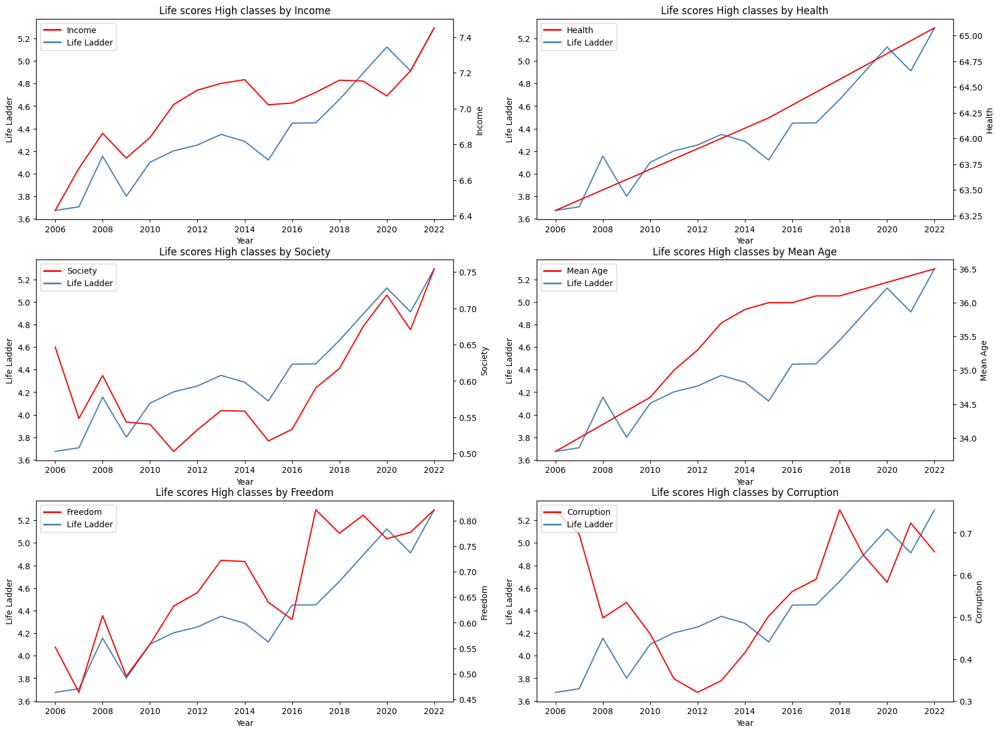

In [ ]:
# The top country grow happiness scores

df2 = df[df["Country"] == "Georgia"]
factors = {"Income":1, "Health":2, "Society":3, "Mean Age":4, "Freedom":5, "Corruption":6}

plt.figure(figsize =(20,15))
for i in factors:
  plt.subplot(320+ factors[i])
  plt.title(f"Life scores High classes by {i}")
  sns.lineplot(data= df2, x= "Year", y="Life Ladder", color="steelblue")
  plt.twinx()
  sns.lineplot(data= df2, x= "Year", y= i, color="r")
  legend_elements = [
      plt.Line2D([0], [0], color='r', lw=2, label=i),
      plt.Line2D([0], [0], color='steelblue', lw=2, label='Life Ladder')]
  plt.legend(handles=legend_elements, loc='upper left')


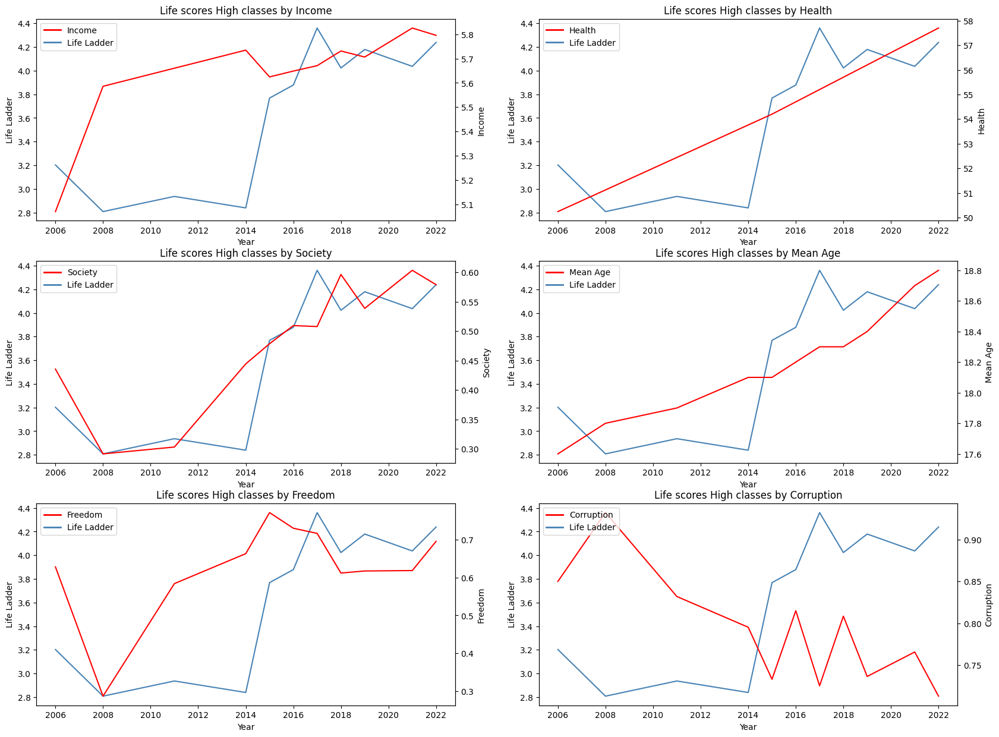

In [ ]:
df1 = df[df["Country"] == "Togo"]

factors = {"Income":1, "Health":2, "Society":3, "Mean Age":4, "Freedom":5, "Corruption":6}

plt.figure(figsize =(20,15))

for i in factors:
  plt.subplot(320+ factors[i])
  plt.title(f"Life scores High classes by {i}")
  sns.lineplot(data= df1, x= "Year", y="Life Ladder", color="steelblue")
  plt.twinx()
  sns.lineplot(data= df1, x= "Year", y= i, color="r")
  legend_elements = [
      plt.Line2D([0], [0], color='r', lw=2, label=i),
      plt.Line2D([0], [0], color='steelblue', lw=2, label='Life Ladder')]
  plt.legend(handles=legend_elements, loc='upper left')



**Top 3 least happy countries**

In [ ]:
# The top 3 countries have the percentages of happiness fluctuations lowly
bad_countries = delta.sort_values(by= "Score", ascending = True)[:3].reset_index() # %
bad_countries

,Country,Score
0,Lebanon,-0.494439
1,Sierra Leone,-0.294295
2,Botswana,-0.275162


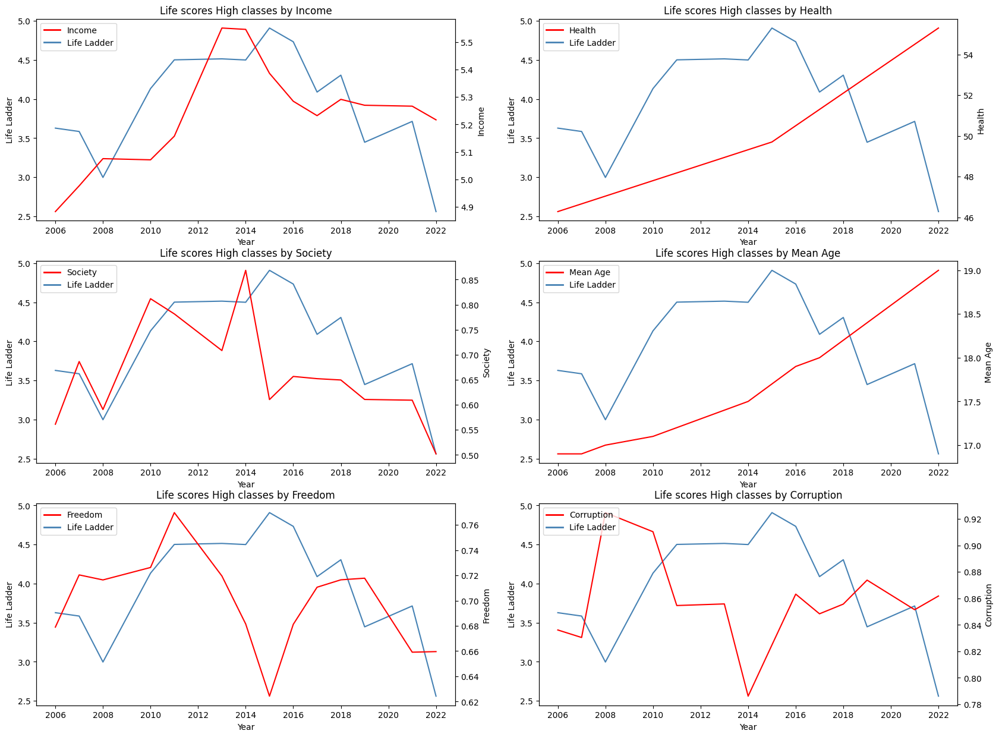

In [ ]:
df1 = df[df["Country"] == "Sierra Leone"]
factors = {"Income":1, "Health":2, "Society":3, "Mean Age":4, "Freedom":5, "Corruption":6}

plt.figure(figsize =(20,15))
for i in factors:
  plt.subplot(320+ factors[i])
  plt.title(f"Life scores High classes by {i}")
  sns.lineplot(data= df1, x= "Year", y="Life Ladder", color="steelblue")
  plt.twinx()
  sns.lineplot(data= df1, x= "Year", y= i, color="r")
  legend_elements = [
      plt.Line2D([0], [0], color='r', lw=2, label=i),
      plt.Line2D([0], [0], color='steelblue', lw=2, label='Life Ladder')]
  plt.legend(handles=legend_elements, loc='upper left')


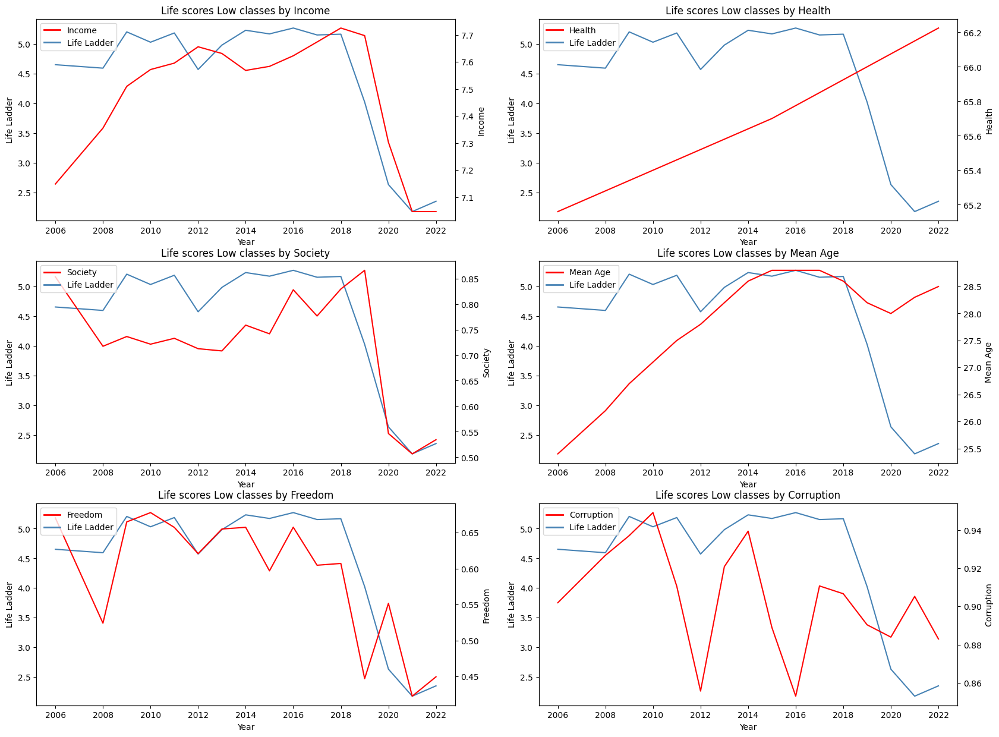

In [ ]:
# Unhappy
df1 = df[df["Country"] == "Lebanon"]

factors = {"Income":1, "Health":2, "Society":3, "Mean Age":4, "Freedom":5, "Corruption":6}

plt.figure(figsize =(20,15))

for i in factors:
  plt.subplot(320+ factors[i])
  plt.title(f"Life scores Low classes by {i}")
  sns.lineplot(data= df1, x= "Year", y="Life Ladder", color="steelblue")
  plt.twinx()
  sns.lineplot(data= df1, x= "Year", y= i, color="r")
  legend_elements = [
      plt.Line2D([0], [0], color='r', lw=2, label=i),
      plt.Line2D([0], [0], color='steelblue', lw=2, label='Life Ladder')]
  plt.legend(handles=legend_elements, loc='upper left')


**Visual the percentages of countries**

In [ ]:
df1 = df[["Country","Year","Income", "Health", "Society", "Mean Age", "Freedom", "Corruption"]]
df1 = df1[(df1["Year"] == 2022) | (df1["Year"] == 2006)].reset_index()

a = ["Georgia", "Nicaragua", "Togo", "Lebanon", "Sierra Leone", "Botswana"]
b = ["Lebanon", "Sierra Leone", "Botswana"]

df_1 = df1[df1["Country"].isin(a)]
df_1

# df_good.to_csv("df_good.csv")
# files.download("df_good.csv")

,index,Country,Year,Income,Health,Society,Mean Age,Freedom,Corruption
18,227,Botswana,2006,7.231259,48.840000,0.883036,20.0,0.823775,0.723239
19,239,Botswana,2022,7.577055,54.724998,0.750399,23.6,0.739403,0.830940
63,676,Georgia,2006,6.430342,63.299999,0.646636,33.8,0.552593,0.751934
64,692,Georgia,2022,7.451904,65.074997,0.754491,36.5,0.820903,0.655172
104,1099,Lebanon,2006,7.148900,65.160004,0.853151,25.4,0.670194,0.901960
105,1114,Lebanon,2022,7.046905,66.224998,0.534528,28.5,0.449575,0.882996
133,1407,Nicaragua,2006,6.015881,64.300003,0.877170,19.7,0.745456,0.844391
134,1423,Nicaragua,2022,6.533737,65.724998,0.844042,24.9,0.913994,0.570192
158,1687,Sierra Leone,2006,4.882622,46.279999,0.561356,16.9,0.679001,0.836166
159,1700,Sierra Leone,2022,5.216930,55.299999,0.502168,19.0,0.659596,0.861837


In [ ]:
# The ratio of delta changes of countries over years
x = df_1["Country"].unique()
dic = {}
c = ["Life Ladder", "Income", "Society", "Health", "Freedom", "Corruption", "Mean Age"]
for i in x:
  for k in a:
    try:
        dic[i] = ((df[df["Year"]==2022].loc[df["Country"] == i, c].values[0]
        - df[df["Year"]==2006].loc[df["Country"] ==i, c].values[0])/
                  df[df["Year"]==2006].loc[df["Country"] ==i, c].values[0])
    except IndexError:
        # Handle the case where there is no data for the country in either year.
        pass
dic

{'Botswana': array([-0.27516163,  0.04781967, -0.15020511,  0.12049546, -0.10242069,
         0.14891494,  0.18      ]),
 'Georgia': array([ 0.44016298,  0.15886586,  0.16679404,  0.02804104,  0.48554854,
        -0.1286836 ,  0.07988166]),
 'Lebanon': array([-0.49443902, -0.01426715, -0.37346564,  0.0163443 , -0.32918569,
        -0.02102486,  0.12204724]),
 'Nicaragua': array([ 0.43319075,  0.08608142, -0.03776727,  0.02216167,  0.2260861 ,
        -0.3247302 ,  0.26395939]),
 'Sierra Leone': array([-0.29429465,  0.06846904, -0.105438  ,  0.19490062, -0.02857832,
         0.0307012 ,  0.12426036]),
 'Togo': array([ 0.32367706,  0.14292202,  0.32960964,  0.14848724,  0.10743539,
        -0.16093538,  0.06818182])}

In [ ]:
# Create DataFrame
delta = pd.DataFrame.from_dict(dic, orient='index', columns=["Life Ladder", "Income", "Society",
                                                             "Health", "Freedom", "Corruption", "Mean Age"])
delta.index.name = 'Country'
delta = delta.reset_index()
delta

,Country,Life Ladder,Income,Society,Health,Freedom,Corruption,Mean Age
0,Botswana,-0.275162,0.047820,-0.150205,0.120495,-0.102421,0.148915,0.180000
1,Georgia,0.440163,0.158866,0.166794,0.028041,0.485549,-0.128684,0.079882
2,Lebanon,-0.494439,-0.014267,-0.373466,0.016344,-0.329186,-0.021025,0.122047
3,Nicaragua,0.433191,0.086081,-0.037767,0.022162,0.226086,-0.324730,0.263959
4,Sierra Leone,-0.294295,0.068469,-0.105438,0.194901,-0.028578,0.030701,0.124260
5,Togo,0.323677,0.142922,0.329610,0.148487,0.107435,-0.160935,0.068182


0 Botswana
1 Georgia
2 Lebanon
3 Nicaragua
4 Sierra Leone
5 Togo


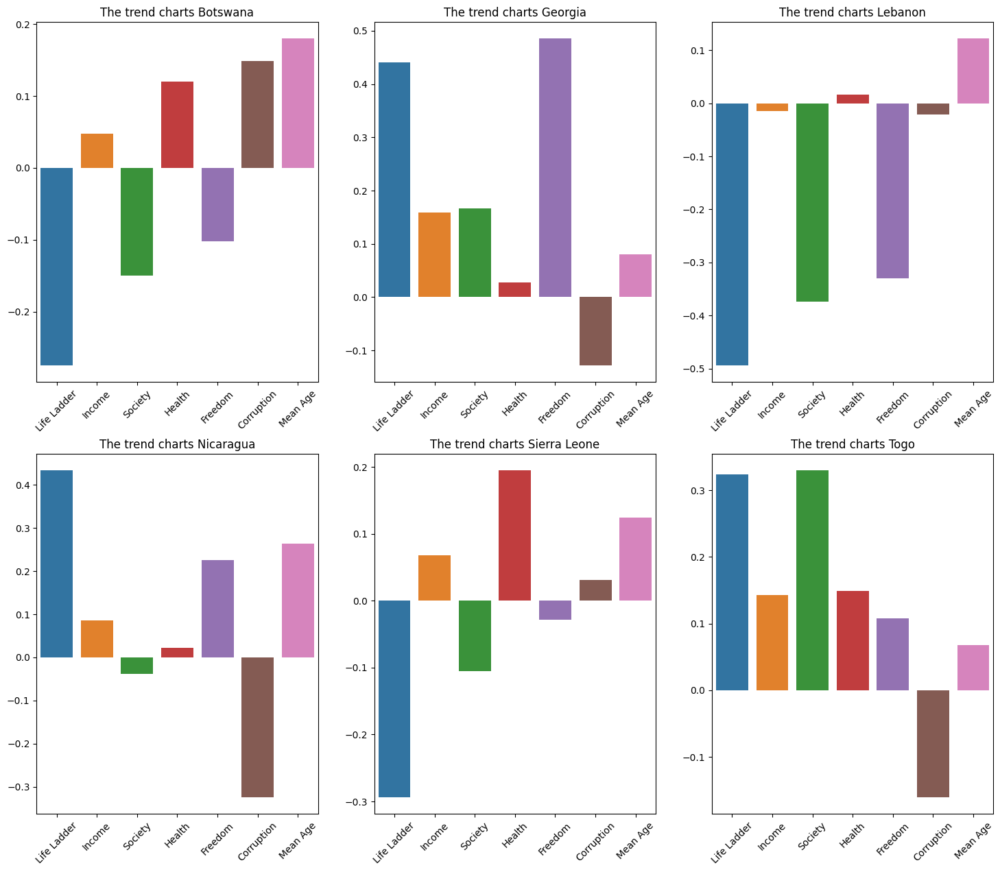

In [ ]:
# The graph illustrates the ratio of countries
fig, axes = plt.subplots(2, 3, figsize=(18,15))
axes = axes.ravel()

for i, country in enumerate(delta["Country"]):
    print(i, country)
    ax = axes[i]
    sns.barplot(data=delta[delta["Country"] == country], ax=ax)
    ax.set_title(f"The trend charts {country}")
    ax.xaxis.set_tick_params(rotation = 45)

# delta.groupby("country").plot(kind="bar")

Connect Tauleau

In [ ]:
from IPython import display
display.IFrame(src="https://public.tableau.com/views/Book1Top3countrieswiththehighestandthelowestgrowth/Top3countrieswiththehighestandthelowestgrowth?:language=en-US&:sid=&:display_count=n&:origin=viz_share_link:showVizHome=no&:embed=true",
               width=990, height=599)

In [ ]:
# delta
# delta.to_csv("delta.csv")
# files.download("delta.csv")

# IV. Prediction models of happiness world

- By using machine learning to predict tendency happiness in the future, looking for factors that plays an crucial role in enhancing happiness.

- We build a model to divide 3 main segments of happiness levels: happiest countries, medium countries, and the worst life countries => convert units into ladder 0 to 10 to compute
  

- Main color to visualize "Blue"

In [ ]:
display.IFrame(src="https://public.tableau.com/views/HappinessmapsWorldwide/Sheet1?:language=en-US&:sid=&:display_count=n&:origin=viz_share_link:showVizHome=no&:embed=true", width=990, height=599)

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn import metrics
from sklearn.metrics import r2_score
import statsmodels.api as sm
import numpy as np

# Input data
df1 = df[["Life Ladder","Income", "Society", "Health", "Mean Age", "Freedom","Corruption"]]
X = df1.drop(columns= ["Life Ladder"])
y = df1[["Life Ladder"]].values

# split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Normolize data
scaler = MinMaxScaler()
X_scaled_train = scaler.fit_transform(X_train)
X_scaled_test = scaler.transform(X_test)

# build and train model
lg = LinearRegression()
lg.fit(X_scaled_train, y_train)

print(f"Coef: {lg.coef_}")
print(f"Intercept: {lg.intercept_}")

# test model
y_pred = lg.predict(X_scaled_test) # There are results | X_test play a role in requirements, results là targer labels
print("Mean Absolute Error:", metrics.mean_absolute_error(y_test, y_pred))
print("Mean Squared Error:", metrics.mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error:", np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("--"*50)
print("R-squared:", r2_score(y_test, y_pred))
print("--"*50)
# interpret model
X2 = sm.add_constant(X_scaled_test)
model_stats = sm.OLS(y_test.reshape(-1, 1), X2).fit()
model_stats.summary()

Coef: [[ 2.54242275  1.96210257  1.81571282 -0.59128667  0.91244741 -0.36017798]]
Intercept: [1.00957597]
Mean Absolute Error: 0.4271050233691126
Mean Squared Error: 0.2960411597533596
Root Mean Squared Error: 0.5440966456001723
----------------------------------------------------------------------------------------------------
R-squared: 0.7582122306183873
----------------------------------------------------------------------------------------------------


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.765
Model:                            OLS   Adj. R-squared:                  0.761
Method:                 Least Squares   F-statistic:                     229.5
Date:                Tue, 30 Apr 2024   Prob (F-statistic):          9.04e-130
Time:                        09:13:30   Log-Likelihood:                -343.49
No. Observations:                 431   AIC:                             701.0
Df Residuals:                     424   BIC:                             729.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2338      0.380      0.616      0.538      -0.513       0.980
x1             2.6768      0.255     10.504      0.000       2.176       3.178
x2             1.6982      0.228      7.455      0.000       1.250       2.146
x3             3.0422      0.499      6.092      0.000       2.061       4.024
x4            -1.0045      0.188     -5.340      0.000      -1.374      -0.635
x5             0.9975      0.169      5.907      0.000       0.666       1.329
x6            -0.3104      0.154     -2.015      0.045      -0.613      -0.008
==============================================================================
Omnibus:                        3.473   Durbin-Watson:                   2.073
Prob(Omnibus):                  0.176   Jarque-Bera (JB):                3.312
Skew:                          -0.159   Prob(JB):                        0.191
Kurtosis:                       3.290   Cond. No.                         45.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
lg.coef_

array([[ 2.54242275,  1.96210257,  1.81571282, -0.59128667,  0.91244741,
        -0.36017798]])

In [ ]:
X.columns

Index(['Income', 'Society', 'Health', 'Mean Age', 'Freedom', 'Corruption'], dtype='object')

<BarContainer object of 6 artists>

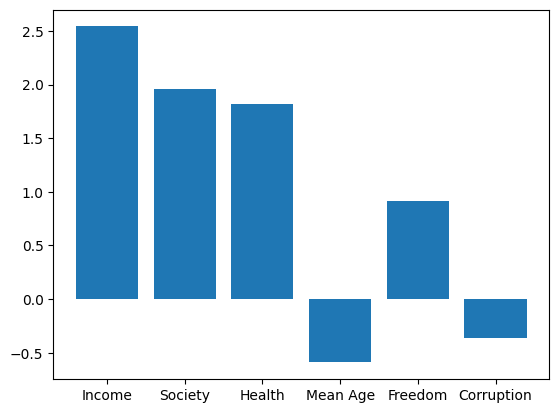

In [ ]:
# The weight of factors impact on life ladder
plt.bar(X.columns, lg.coef_[0])

In [ ]:
# Normolize data
from sklearn.preprocessing import MinMaxScaler

# create a random dataset
X1 = df1.drop(columns=["Life Ladder"]).values

# create a MinMaxScaler object
scaler = MinMaxScaler()

# fit the scaler to the data
scaler.fit(X1)

# transform the data
X_scaled = scaler.transform(X1)

# print the scaled data
print(X_scaled)

[[0.10446156 0.29302778 0.64615159 0.00573066 0.63297511 0.89284671]
 [0.13074777 0.42692662 0.6505793  0.01432665 0.57907794 0.85946243]
 [0.16410525 0.40949442 0.655007   0.01719198 0.47082561 0.70834685]
 ...
 [0.30210951 0.64419511 0.69153571 0.11747851 0.53016199 0.79458101]
 [0.34177395 0.60191999 0.69854624 0.12320917 0.56360304 0.76127406]
 [0.33306622 0.57691942 0.70555682 0.1260745  0.54209662 0.75672474]]


In [ ]:
df[X.columns] = X_scaled
df.head()

,Country,Year,Life Ladder,Society,Health,Freedom,Corruption,Possitive,Negative,Mean Age,Income,Rank
0,Afghanistan,2008,3.723590,0.293028,0.646152,0.632975,0.892847,0.414297,0.258195,0.005731,0.104462,Low
1,Afghanistan,2009,4.401778,0.426927,0.650579,0.579078,0.859462,0.481421,0.237092,0.014327,0.130748,Low
2,Afghanistan,2010,4.758381,0.409494,0.655007,0.470826,0.708347,0.516907,0.275324,0.017192,0.164105,Low
3,Afghanistan,2011,3.831719,0.385820,0.659435,0.327588,0.734022,0.479835,0.267175,0.025788,0.176326,Low
4,Afghanistan,2012,3.782938,0.385205,0.663862,0.375735,0.780971,0.613513,0.267919,0.034384,0.187282,Low


In [ ]:
Income, Society, Health, Mean_Age, Freedom, Corruption = lg.coef_[0]
a = {"Income":Income, "Society":Society, "Health":Health,
     "Mean Age": Mean_Age, "Freedom":Freedom, "Corruption": Corruption}

data = df.copy()
for i in a:
  # data[i] = df1[i]*a[i]
  data[i] = df[i]*a[i]
data.head()

,Country,Year,Life Ladder,Society,Health,Freedom,Corruption,Possitive,Negative,Mean Age,Income,Rank
0,Afghanistan,2008,3.723590,0.574951,1.173226,0.577556,-0.321584,0.414297,0.258195,-0.003388,0.265585,Low
1,Afghanistan,2009,4.401778,0.837674,1.181265,0.528378,-0.309559,0.481421,0.237092,-0.008471,0.332416,Low
2,Afghanistan,2010,4.758381,0.803470,1.189305,0.429604,-0.255131,0.516907,0.275324,-0.010165,0.417225,Low
3,Afghanistan,2011,3.831719,0.757019,1.197344,0.298907,-0.264379,0.479835,0.267175,-0.015248,0.448294,Low
4,Afghanistan,2012,3.782938,0.755812,1.205384,0.342838,-0.281289,0.613513,0.267919,-0.020331,0.476149,Low


In [ ]:
# score life ladder of countries

data["Bias"] = lg.intercept_[0]
data["Life Ladder"] = (data["Society"] + data["Health"] + data["Mean Age"] + data["Income"]
                       + data["Freedom"] + data["Corruption"] + data["Bias"])

data = data.groupby("Country").mean(numeric_only=True).sort_values(by="Life Ladder", ascending= False)
data = data.reset_index()

data.drop(columns=["Possitive", "Negative", "Year"], inplace = True)
data.head()

,Country,Life Ladder,Society,Health,Freedom,Corruption,Mean Age,Income,Bias
0,Norway,7.319678,1.860862,1.722142,0.870334,-0.113850,-0.416640,2.387253,1.009576
1,Luxembourg,7.296945,1.780200,1.727558,0.816108,-0.128927,-0.414522,2.506952,1.009576
2,Switzerland,7.235435,1.833548,1.751308,0.827056,-0.099985,-0.464502,2.378434,1.009576
3,Denmark,7.196047,1.881896,1.701787,0.858054,-0.061312,-0.449924,2.255971,1.009576
4,Iceland,7.181468,1.939319,1.745167,0.844628,-0.251182,-0.361210,2.255171,1.009576


In [ ]:
# Happiness levels board
display.IFrame(src="https://public.tableau.com/views/Happinesslevelsboard/Sheet1?:language=en-US&:sid=&:display_count=n&:origin=viz_share_link:showVizHome=no&:embed=true", width=990, height=599)

# V. Conlusion



*   Almost the best happy countries are developed countries where they have high-quality healthy service, high-income, high young Age, and low ratio corruption.
*   In addition, countries with average levels of happiness increase their happiness scores more significantly than high and low countries.
*   The happiest countries are mainly concentrated in Europe and America, while the average happy countries are in Asia, and the less happy countries are mainly concentrated in Africa.




We hope this project series will be helpful for people's upcoming journeys and understanding of their country in the world. 😊